In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import gc

### source = https://data.mendeley.com/datasets/bv2hvm4pmz/3

In [2]:
df_brown = pd.read_csv("complete_measure_node_airport_brown.csv", sep =";")

In [3]:
df_brown

,id_measure,node_id,ads1115_value,ads1115_voltage,scd30_co2,scd30_temp,scd30_hum,sps30_pm05_count,sps30_pm1_count,sps30_pm1_ug,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,ts_insertion
0,1,node-air-brown,2015,0.251883,659.087,29.3526,51.7715,43.0549,50.3810,6.32602,50.4870,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,2022-10-27 10:57:14
1,2,node-air-brown,1950,0.243757,658.184,29.3660,51.7990,43.5107,50.9143,6.39299,51.0214,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,2022-10-27 10:57:17
2,3,node-air-brown,1995,0.249133,655.991,29.3927,51.8387,44.1547,51.6679,6.48762,51.7767,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,2022-10-27 10:57:19
3,4,node-air-brown,2010,0.251258,655.740,29.3526,51.8906,44.2329,51.7594,6.49910,51.8683,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,2022-10-27 10:57:21
4,5,node-air-brown,1993,0.249133,655.774,29.3660,51.8448,44.4443,52.0068,6.53017,52.1163,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,2022-10-27 10:57:23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9937006,10162291,node-air-brown,2237,0.279634,560.587,28.0709,50.0320,14.1197,16.5222,2.07459,16.5570,2.19380,16.5605,2.19380,16.5631,2.19380,0.396032,2023-10-07 22:46:52
9937007,10162292,node-air-brown,2221,0.274383,560.002,28.0415,50.0763,13.9800,16.3588,2.05407,16.3932,2.17211,16.3968,2.17211,16.3994,2.17211,0.397891,2023-10-07 22:46:55
9937008,10162293,node-air-brown,2209,0.276133,559.953,28.0842,50.1312,13.8982,16.2631,2.04205,16.2973,2.15939,16.3008,2.15939,16.3034,2.15939,0.398572,2023-10-07 22:46:57
9937009,10162294,node-air-brown,2217,0.277008,559.799,28.0415,49.9451,14.0433,16.4329,2.06338,16.4675,2.18194,16.4710,2.18195,16.4736,2.18194,0.399749,2023-10-07 22:46:59


In [6]:
df_gold = pd.read_csv("complete_measure_node_airport_gold.csv", sep =";")

In [7]:
df_gold

,id_measure,node_id,ads1115_value,ads1115_voltage,scd30_co2,scd30_temp,scd30_hum,sps30_pm05_count,sps30_pm1_count,sps30_pm1_ug,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,ts_insertion
0,1,node-air-gold,1950,0.243757,606.316,29.3313,51.7258,26.4676,31.5050,3.97163,31.6969,4.19985,31.7065,4.19985,31.7126,4.19985,0.553393,2022-10-27 10:55:14
1,2,node-air-gold,1997,0.249633,605.303,29.3019,51.6693,26.3993,31.4237,3.96138,31.6152,4.18902,31.6247,4.18902,31.6308,4.18902,0.549469,2022-10-27 10:55:16
2,3,node-air-gold,1997,0.249633,605.580,29.3153,51.6327,26.4615,31.4977,3.97071,31.6896,4.19888,31.6992,4.19888,31.7053,4.19888,0.550178,2022-10-27 10:55:18
3,4,node-air-gold,1977,0.247133,605.191,29.3153,51.7242,26.4615,31.4977,3.97071,31.6896,4.19888,31.6992,4.19888,31.7053,4.19888,0.550178,2022-10-27 10:55:20
4,5,node-air-gold,1957,0.244632,603.975,29.3019,51.6556,26.4615,31.4977,3.97071,31.6896,4.19888,31.6992,4.19888,31.7053,4.19888,0.550178,2022-10-27 10:55:22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7105446,7490026,node-air-gold,1663,0.207881,713.675,28.1483,43.4067,38.6570,46.0142,5.80072,46.2946,6.13404,46.3085,6.13405,46.3175,6.13405,0.540815,2023-10-13 08:04:12
7105447,7490027,node-air-gold,1664,0.208006,713.536,28.1483,43.3792,39.3510,46.8404,5.90487,47.1258,6.24418,47.1399,6.24418,47.1491,6.24418,0.540534,2023-10-13 08:04:14
7105448,7490028,node-air-gold,1645,0.205631,713.131,28.1617,43.3243,39.4641,46.9749,5.92183,47.2612,6.26211,47.2754,6.26212,47.2845,6.26212,0.544188,2023-10-13 08:04:17
7105449,7490029,node-air-gold,1664,0.207881,711.359,28.1617,43.3655,39.8152,47.3929,5.97452,47.6817,6.31783,47.6960,6.31783,47.7052,6.31783,0.543882,2023-10-13 08:04:19


In [8]:
df_silver = pd.read_csv("complete_measure_node_airport_silver.csv", sep =";")

In [9]:
df_silver

,id_measure,node_id,ads1115_value,ads1115_voltage,scd30_co2,scd30_temp,scd30_hum,sps30_pm05_count,sps30_pm1_count,sps30_pm1_ug,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,ts_insertion
0,1,node-air-silver,2270,0.283759,488.513,28.1029,55.0400,40.8925,47.4980,5.96961,47.6426,6.31264,47.6508,6.31264,47.6574,6.31265,0.412753,2022-10-27 10:23:07
1,2,node-air-silver,2295,0.286884,488.629,28.1029,55.0400,40.6003,47.1587,5.92697,47.3022,6.26754,47.3104,6.26754,47.3169,6.26755,0.417791,2022-10-27 10:23:09
2,3,node-air-silver,2352,0.294009,488.621,28.0896,55.0385,40.6168,47.1778,5.92936,47.3213,6.27008,47.3295,6.27008,47.3360,6.27008,0.419977,2022-10-27 10:23:11
3,4,node-air-silver,2405,0.300634,488.153,28.1163,55.0659,40.9238,47.5344,5.97419,47.6791,6.31748,47.6873,6.31748,47.6939,6.31748,0.422307,2022-10-27 10:23:13
4,5,node-air-silver,2443,0.305384,488.058,28.1029,55.0293,41.0510,47.6821,5.99276,47.8273,6.33711,47.8356,6.33711,47.8421,6.33712,0.420938,2022-10-27 10:23:15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11135469,11454424,node-air-silver,2538,0.317635,643.554,28.2979,43.1290,42.6115,49.5020,6.22209,49.6570,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,2023-10-13 08:04:18
11135470,11454425,node-air-silver,2546,0.317885,643.205,28.3433,43.0923,41.8509,48.6179,6.11092,48.7698,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,2023-10-13 08:04:20
11135471,11454426,node-air-silver,2580,0.322510,642.603,28.3299,43.1183,41.6934,48.4360,6.08814,48.5880,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,2023-10-13 08:04:22
11135472,11454427,node-air-silver,2592,0.324010,642.695,28.3299,43.2373,41.5168,48.2319,6.06258,48.3838,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,2023-10-13 08:04:25


In [8]:
df_combined = pd.concat([df_brown, df_gold, df_silver], ignore_index=True)
df_combined

,id_measure,node_id,ads1115_value,ads1115_voltage,scd30_co2,scd30_temp,scd30_hum,sps30_pm05_count,sps30_pm1_count,sps30_pm1_ug,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,ts_insertion
0,1,node-air-brown,2015,0.251883,659.087,29.3526,51.7715,43.0549,50.3810,6.32602,50.4870,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,2022-10-27 10:57:14
1,2,node-air-brown,1950,0.243757,658.184,29.3660,51.7990,43.5107,50.9143,6.39299,51.0214,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,2022-10-27 10:57:17
2,3,node-air-brown,1995,0.249133,655.991,29.3927,51.8387,44.1547,51.6679,6.48762,51.7767,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,2022-10-27 10:57:19
3,4,node-air-brown,2010,0.251258,655.740,29.3526,51.8906,44.2329,51.7594,6.49910,51.8683,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,2022-10-27 10:57:21
4,5,node-air-brown,1993,0.249133,655.774,29.3660,51.8448,44.4443,52.0068,6.53017,52.1163,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,2022-10-27 10:57:23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28177931,11454424,node-air-silver,2538,0.317635,643.554,28.2979,43.1290,42.6115,49.5020,6.22209,49.6570,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,2023-10-13 08:04:18
28177932,11454425,node-air-silver,2546,0.317885,643.205,28.3433,43.0923,41.8509,48.6179,6.11092,48.7698,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,2023-10-13 08:04:20
28177933,11454426,node-air-silver,2580,0.322510,642.603,28.3299,43.1183,41.6934,48.4360,6.08814,48.5880,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,2023-10-13 08:04:22
28177934,11454427,node-air-silver,2592,0.324010,642.695,28.3299,43.2373,41.5168,48.2319,6.06258,48.3838,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,2023-10-13 08:04:25


In [9]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28177936 entries, 0 to 28177935
Data columns (total 18 columns):
 #   Column            Dtype  
---  ------            -----  
 0   id_measure        int64  
 1   node_id           object 
 2   ads1115_value     int64  
 3   ads1115_voltage   float64
 4   scd30_co2         float64
 5   scd30_temp        float64
 6   scd30_hum         float64
 7   sps30_pm05_count  float64
 8   sps30_pm1_count   float64
 9   sps30_pm1_ug      float64
 10  sps30_pm25_count  float64
 11  sps30_pm25_ug     float64
 12  sps30_pm4_count   float64
 13  sps30_pm4_ug      float64
 14  sps30_pm10_count  float64
 15  sps30_pm10_ug     float64
 16  sps30_pm_typ      float64
 17  ts_insertion      object 
dtypes: float64(14), int64(2), object(2)
memory usage: 3.8+ GB


In [10]:
for node_id in df_combined["node_id"].unique():
    print(f"Null values for {node_id} node")
    null_counts = df_combined[df_combined["node_id"] == node_id].isnull().sum()
    print(null_counts)
    print("***********************************")


Null values for node-air-brown node
id_measure           0
node_id              0
ads1115_value        0
ads1115_voltage      0
scd30_co2            0
scd30_temp           0
scd30_hum            0
sps30_pm05_count    32
sps30_pm1_count     37
sps30_pm1_ug         0
sps30_pm25_count    41
sps30_pm25_ug       23
sps30_pm4_count     43
sps30_pm4_ug        23
sps30_pm10_count    45
sps30_pm10_ug       27
sps30_pm_typ        49
ts_insertion         0
dtype: int64
***********************************
Null values for node-air-gold node
id_measure           0
node_id              0
ads1115_value        0
ads1115_voltage      0
scd30_co2            0
scd30_temp           0
scd30_hum            0
sps30_pm05_count    12
sps30_pm1_count     15
sps30_pm1_ug         0
sps30_pm25_count    17
sps30_pm25_ug        8
sps30_pm4_count     23
sps30_pm4_ug         9
sps30_pm10_count    23
sps30_pm10_ug       11
sps30_pm_typ        25
ts_insertion         0
dtype: int64
***********************************
Nul

In [11]:
df_combined.shape

(28177936, 18)

In [12]:
df_combined.dropna(inplace=True)

In [15]:
df_combined.shape

(28177816, 18)

In [ ]:
df_combined.columns

Index(['id_measure', 'node_id', 'ads1115_value', 'ads1115_voltage',
       'scd30_co2', 'scd30_temp', 'scd30_hum', 'sps30_pm05_count',
       'sps30_pm1_count', 'sps30_pm1_ug', 'sps30_pm25_count', 'sps30_pm25_ug',
       'sps30_pm4_count', 'sps30_pm4_ug', 'sps30_pm10_count', 'sps30_pm10_ug',
       'sps30_pm_typ', 'ts_insertion'],
      dtype='object')

In [58]:
columns_to_plot = [
    'ads1115_value', 'ads1115_voltage', 'scd30_co2', 'scd30_temp', 
    'scd30_hum', 'sps30_pm05_count', 'sps30_pm1_count', 'sps30_pm1_ug', 
    'sps30_pm25_count', 'sps30_pm25_ug', 'sps30_pm4_count', 'sps30_pm4_ug', 
    'sps30_pm10_count', 'sps30_pm10_ug', 'sps30_pm_typ'
]

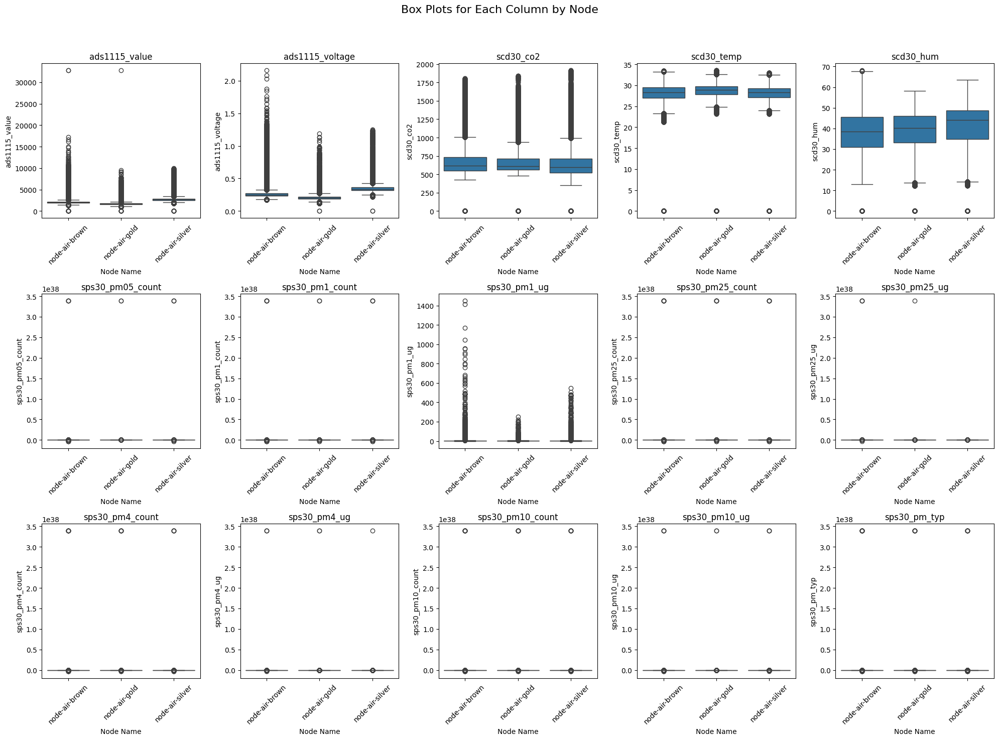

In [ ]:
fig, axes = plt.subplots(3, 5, figsize=(20, 15))
fig.suptitle('Box Plots for Each Column by Node', fontsize=16)

for i, column in enumerate(columns_to_plot):
    row = i // 5
    col = i % 5
    sns.boxplot(x='node_id', y=column, data=df_combined, ax=axes[row, col])
    axes[row, col].set_title(column)
    axes[row, col].set_xlabel('Node Name')
    axes[row, col].set_ylabel(column)
    axes[row, col].tick_params(axis='x', rotation=45)

for j in range(i + 1, 3 * 5):
    fig.delaxes(axes[j // 5, j % 5])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [24]:
df_combined.to_csv("df_filtered_missing_values.csv", index=False, sep=";")

In [57]:
df_combined = pd.read_csv("df_filtered_missing_values.csv", sep=";")

In [ ]:
columns_to_clean = [
    'ads1115_value', 'ads1115_voltage', 'scd30_co2', 'scd30_temp', 
    'scd30_hum', 'sps30_pm05_count', 'sps30_pm1_count', 'sps30_pm1_ug', 
    'sps30_pm25_count', 'sps30_pm25_ug', 'sps30_pm4_count', 'sps30_pm4_ug', 
    'sps30_pm10_count', 'sps30_pm10_ug', 'sps30_pm_typ'
]

filtered_dfs = []

for node in df_combined["node_id"].unique():
    node_df = df_combined[df_combined["node_id"] == node]
    
    for column in columns_to_clean:
        Q1 = node_df[column].quantile(0.25)
        Q3 = node_df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        node_df = node_df[(node_df[column] >= lower_bound) & (node_df[column] <= upper_bound)]
    
    filtered_dfs.append(node_df)

df_combined_filtered = pd.concat(filtered_dfs, ignore_index=True)

del filtered_dfs, node_df, df_combined
gc.collect()

444

In [62]:
df_combined_filtered

,id_measure,node_id,ads1115_value,ads1115_voltage,scd30_co2,scd30_temp,scd30_hum,sps30_pm05_count,sps30_pm1_count,sps30_pm1_ug,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,ts_insertion
0,1,node-air-brown,2015,0.251883,659.087,29.3526,51.7715,43.0549,50.3810,6.32602,50.4870,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,2022-10-27 10:57:14
1,2,node-air-brown,1950,0.243757,658.184,29.3660,51.7990,43.5107,50.9143,6.39299,51.0214,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,2022-10-27 10:57:17
2,3,node-air-brown,1995,0.249133,655.991,29.3927,51.8387,44.1547,51.6679,6.48762,51.7767,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,2022-10-27 10:57:19
3,4,node-air-brown,2010,0.251258,655.740,29.3526,51.8906,44.2329,51.7594,6.49910,51.8683,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,2022-10-27 10:57:21
4,5,node-air-brown,1993,0.249133,655.774,29.3660,51.8448,44.4443,52.0068,6.53017,52.1163,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,2022-10-27 10:57:23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21930537,11454424,node-air-silver,2538,0.317635,643.554,28.2979,43.1290,42.6115,49.5020,6.22209,49.6570,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,2023-10-13 08:04:18
21930538,11454425,node-air-silver,2546,0.317885,643.205,28.3433,43.0923,41.8509,48.6179,6.11092,48.7698,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,2023-10-13 08:04:20
21930539,11454426,node-air-silver,2580,0.322510,642.603,28.3299,43.1183,41.6934,48.4360,6.08814,48.5880,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,2023-10-13 08:04:22
21930540,11454427,node-air-silver,2592,0.324010,642.695,28.3299,43.2373,41.5168,48.2319,6.06258,48.3838,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,2023-10-13 08:04:25


In [63]:
columns_to_plot = [
    'ads1115_value', 'ads1115_voltage', 'scd30_co2', 'scd30_temp', 
    'scd30_hum', 'sps30_pm05_count', 'sps30_pm1_count', 'sps30_pm1_ug', 
    'sps30_pm25_count', 'sps30_pm25_ug', 'sps30_pm4_count', 'sps30_pm4_ug', 
    'sps30_pm10_count', 'sps30_pm10_ug', 'sps30_pm_typ'
]

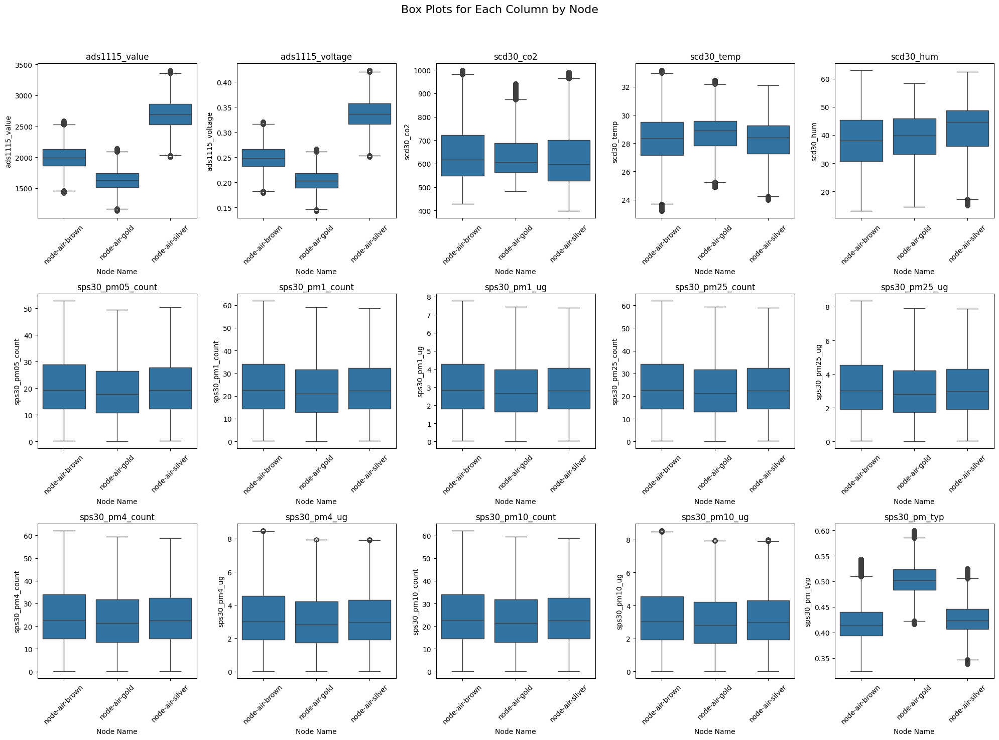

In [ ]:
fig, axes = plt.subplots(3, 5, figsize=(20, 15))
fig.suptitle('Box Plots for Each Column by Node', fontsize=16)

for i, column in enumerate(columns_to_plot):
    row = i // 5
    col = i % 5
    sns.boxplot(x='node_id', y=column, data=df_combined_filtered, ax=axes[row, col])
    axes[row, col].set_title(column)
    axes[row, col].set_xlabel('Node Name')
    axes[row, col].set_ylabel(column)
    axes[row, col].tick_params(axis='x', rotation=45)

for j in range(i + 1, 3 * 5):
    fig.delaxes(axes[j // 5, j % 5])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [10]:
df_combined_filtered.to_csv("df_filtered_missing_values_and_outliers.csv", index=False, sep=";")

In [11]:
df_combined_filtered = pd.read_csv("df_filtered_missing_values_and_outliers.csv", sep=";")

In [ ]:
df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-brown") & 
                                              ((df_combined_filtered["ads1115_value"] > 2500) | 
                                               (df_combined_filtered["ads1115_value"] < 1480)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                              ((df_combined_filtered["ads1115_value"] > 2080) | 
                                               (df_combined_filtered["ads1115_value"] < 1180)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") & 
                                              ((df_combined_filtered["ads1115_value"] > 3350) | 
                                               (df_combined_filtered["ads1115_value"] < 2040)))]

#########################################################################################################

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-brown") & 
                                              ((df_combined_filtered["ads1115_voltage"] < 0.183506) | 
                                               (df_combined_filtered["ads1115_voltage"] > 0.31400)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                              ((df_combined_filtered["ads1115_voltage"] < 0.147004) |  
                                               (df_combined_filtered["ads1115_voltage"] > 0.260008)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") & 
                                              ((df_combined_filtered["ads1115_voltage"] < 0.255658) | 
                                               (df_combined_filtered["ads1115_voltage"] > 0.419438)))]

#########################################################################################################
df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-brown") & 
                                              (df_combined_filtered["scd30_co2"] > 963.807))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                              (df_combined_filtered["scd30_co2"] > 828.731))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") & 
                                              (df_combined_filtered["scd30_co2"] > 946.093))]

#########################################################################################################
df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-brown") & 
                                              ((df_combined_filtered["scd30_temp"] > 32.6632) | 
                                               (df_combined_filtered["scd30_temp"] < 23.7895)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                              ((df_combined_filtered["scd30_temp"] > 31.9449) | 
                                               (df_combined_filtered["scd30_temp"] < 25.4905)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") &  
                                               (df_combined_filtered["scd30_temp"] < 24.4879))]

#########################################################################################################

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                               (df_combined_filtered["scd30_hum"] < 16.0000))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") & 
                                               (df_combined_filtered["scd30_hum"] < 18.3704))]
#########################################################################################################

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                               (df_combined_filtered["sps30_pm05_count"] > 47.5601))]

#########################################################################################################

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                               (df_combined_filtered["sps30_pm25_ug"] > 7.552))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") & 
                                               (df_combined_filtered["sps30_pm25_ug"] > 7.8467))]

#########################################################################################################
df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-brown") & 
                                              (df_combined_filtered["sps30_pm4_ug"] > 8.42664))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                              (df_combined_filtered["sps30_pm4_ug"] > 7.46652))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") & 
                                              (df_combined_filtered["sps30_pm4_ug"] > 7.85087))]

#########################################################################################################
df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-brown") & 
                                              ((df_combined_filtered["sps30_pm_typ"] > 0.49) | 
                                               (df_combined_filtered["sps30_pm_typ"] < 0.336325)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-gold") & 
                                              ((df_combined_filtered["sps30_pm_typ"] > 0.569433) | 
                                               (df_combined_filtered["sps30_pm_typ"] < 0.430000)))]

df_combined_filtered = df_combined_filtered[~((df_combined_filtered["node_id"] == "node-air-silver") & 
                                              ((df_combined_filtered["sps30_pm_typ"] > 0.49) | 
                                               (df_combined_filtered["sps30_pm_typ"] < 0.368123)))]


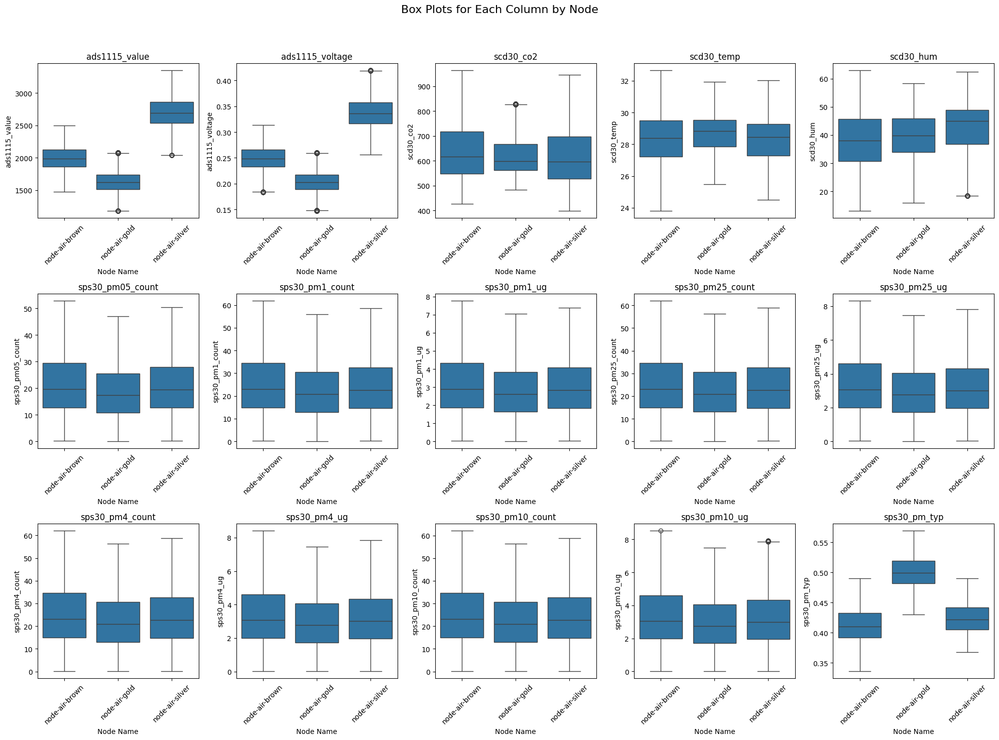

In [ ]:
fig, axes = plt.subplots(3, 5, figsize=(20, 15))
fig.suptitle('Box Plots for Each Column by Node', fontsize=16)

for i, column in enumerate(columns_to_plot):
    row = i // 5
    col = i % 5
    sns.boxplot(x='node_id', y=column, data=df_combined_filtered, ax=axes[row, col])
    axes[row, col].set_title(column)
    axes[row, col].set_xlabel('Node Name')
    axes[row, col].set_ylabel(column)
    axes[row, col].tick_params(axis='x', rotation=45)

for j in range(i + 1, 3 * 5):
    fig.delaxes(axes[j // 5, j % 5])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [54]:
df_combined_filtered.to_csv("df_filtered_missing_values_and_outliers_2.csv", index=False, sep=";")

In [ ]:
df_combined_filtered = pd.read_csv("df_filtered_missing_values_and_outliers_2.csv", sep=";")

In [4]:
df_combined_filtered.shape

(19649480, 18)

In [5]:
df_combined_filtered

,id_measure,node_id,ads1115_value,ads1115_voltage,scd30_co2,scd30_temp,scd30_hum,sps30_pm05_count,sps30_pm1_count,sps30_pm1_ug,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,ts_insertion
0,1,node-air-brown,2015,0.251883,659.087,29.3526,51.7715,43.0549,50.3810,6.32602,50.4870,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,2022-10-27 10:57:14
1,2,node-air-brown,1950,0.243757,658.184,29.3660,51.7990,43.5107,50.9143,6.39299,51.0214,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,2022-10-27 10:57:17
2,3,node-air-brown,1995,0.249133,655.991,29.3927,51.8387,44.1547,51.6679,6.48762,51.7767,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,2022-10-27 10:57:19
3,4,node-air-brown,2010,0.251258,655.740,29.3526,51.8906,44.2329,51.7594,6.49910,51.8683,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,2022-10-27 10:57:21
4,5,node-air-brown,1993,0.249133,655.774,29.3660,51.8448,44.4443,52.0068,6.53017,52.1163,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,2022-10-27 10:57:23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19649475,11454424,node-air-silver,2538,0.317635,643.554,28.2979,43.1290,42.6115,49.5020,6.22209,49.6570,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,2023-10-13 08:04:18
19649476,11454425,node-air-silver,2546,0.317885,643.205,28.3433,43.0923,41.8509,48.6179,6.11092,48.7698,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,2023-10-13 08:04:20
19649477,11454426,node-air-silver,2580,0.322510,642.603,28.3299,43.1183,41.6934,48.4360,6.08814,48.5880,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,2023-10-13 08:04:22
19649478,11454427,node-air-silver,2592,0.324010,642.695,28.3299,43.2373,41.5168,48.2319,6.06258,48.3838,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,2023-10-13 08:04:25


In [ ]:
import numpy as np
import gc

aqi_breakpoints = {
    'PM2.5': np.array([
        [0.0, 9.0, 0, 50],
        [9.1, 35.4, 51, 100],
        [35.5, 55.4, 101, 150],
        [55.5, 125.4, 151, 200],
        [125.5, 225.4, 201, 300],
        [225.5, 500.4, 301, 500]
    ]),
    'PM10': np.array([
        [0, 54, 0, 50],
        [55, 154, 51, 100],
        [155, 254, 101, 150],
        [255, 354, 151, 200],
        [355, 424, 201, 300],
        [425, 604, 301, 500]
    ])
}

def calculate_aqi_np(concentration, breakpoints):
    aqi = np.zeros_like(concentration)
    for bp in breakpoints:
        mask = (concentration >= bp[0]) & (concentration <= bp[1])
        aqi[mask] = ((bp[3] - bp[2]) / (bp[1] - bp[0])) * (concentration[mask] - bp[0]) + bp[2]
    return np.round(aqi)

pm25_values = df_combined_filtered['sps30_pm25_ug'].values
pm10_values = df_combined_filtered['sps30_pm10_ug'].values

aqi_pm25 = calculate_aqi_np(pm25_values, aqi_breakpoints['PM2.5'])
aqi_pm10 = calculate_aqi_np(pm10_values, aqi_breakpoints['PM10'])

df_combined_filtered['AQI'] = np.maximum(aqi_pm25, aqi_pm10)

del pm25_values, pm10_values, aqi_pm25, aqi_pm10
gc.collect()

0

In [5]:
# List of official holidays in Italy
italy_holidays = [
    "2022-01-01",  # New Year
    "2022-04-17",  # Easter
    "2022-04-18",  # Easter Monday
    "2022-04-25",  # Liberation Day
    "2022-05-01",  # Labor Day
    "2022-06-02",  # Republic Day
    "2022-08-15",  # Ferragosto
    "2022-11-01",  # All Saints' Day
    "2022-12-08",  # Immaculate Conception
    "2022-12-25",  # Christmas
    "2022-12-26",  # St. Stephen's Day
    # Extend the list for 2023 holidays
    "2023-01-01", "2023-04-09", "2023-04-10", "2023-04-25",
    "2023-05-01", "2023-06-02", "2023-08-15", "2023-11-01",
    "2023-12-08", "2023-12-25", "2023-12-26"
]

# Convert holidays to datetime format
italy_holidays = np.array(pd.to_datetime(italy_holidays))

# Convert 'ts_insertion' column to datetime format
df_combined_filtered['ts_insertion'] = pd.to_datetime(df_combined_filtered['ts_insertion'])
dates = df_combined_filtered['ts_insertion'].dt.date

# Identify weekends (Saturday and Sunday)
weekends = np.isin(df_combined_filtered['ts_insertion'].dt.weekday, [5, 6])  # 5 = Saturday, 6 = Sunday

# Initialize a boolean array for special days
special_days = weekends.copy()

# Add logic for extended holidays based on your specific rules
for holiday in italy_holidays:
    holiday_date = pd.Timestamp(holiday).date()  # Convert to Python date
    holiday_weekday = pd.Timestamp(holiday).weekday()  # Get weekday (0=Monday, ..., 6=Sunday)

    if holiday_weekday == 4:  # Friday holiday
        # Include Thursday, Friday, Saturday, and Sunday
        special_days |= dates.isin([
            holiday_date - pd.Timedelta(days=1),  # Thursday
            holiday_date,  # Friday
            holiday_date + pd.Timedelta(days=1),  # Saturday
            holiday_date + pd.Timedelta(days=2)   # Sunday
        ])
    elif holiday_weekday == 0:  # Monday holiday
        # Include Friday, Saturday, Sunday, and Monday
        special_days |= dates.isin([
            holiday_date - pd.Timedelta(days=3),  # Friday
            holiday_date - pd.Timedelta(days=2),  # Saturday
            holiday_date - pd.Timedelta(days=1),  # Sunday
            holiday_date  # Monday
        ])
    elif holiday_weekday in [5, 6]:  # Saturday or Sunday holiday
        # For Saturday and Sunday, just keep normal weekend rules
        special_days |= weekends

# Assign the 'Holidays' column based on the result
df_combined_filtered['Holidays'] = np.where(special_days, 1, 0)

# Memory cleanup
del italy_holidays, weekends, dates, special_days, holiday_date
gc.collect()  # Trigger garbage collection to free memory

0

In [ ]:
import pandas as pd

df_combined_filtered['ts_insertion'] = pd.to_datetime(df_combined_filtered['ts_insertion'])

df_combined_filtered['Month'] = df_combined_filtered['ts_insertion'].dt.month

def get_season(month):
    if month in [12, 1, 2]:
        return 0
    elif month in [3, 4, 5]:
        return 1
    elif month in [6, 7, 8]:
        return 2
    elif month in [9, 10, 11]:
        return 3

df_combined_filtered['Season'] = df_combined_filtered['Month'].apply(get_season)

In [7]:
df_combined_filtered['Hour'] = df_combined_filtered['ts_insertion'].dt.hour

In [8]:
# 0 = Monday, 6 = Sunday
df_combined_filtered['Day_of_Week'] = df_combined_filtered['ts_insertion'].dt.dayofweek

In [9]:
df_combined_filtered['PM_Total_Count'] = (
    df_combined_filtered['sps30_pm05_count'] +
    df_combined_filtered['sps30_pm1_count'] +
    df_combined_filtered['sps30_pm25_count'] +
    df_combined_filtered['sps30_pm4_count'] +
    df_combined_filtered['sps30_pm10_count']
)


In [10]:
df_combined_filtered['PM_Total_Mass'] = (
    df_combined_filtered['sps30_pm1_ug'] +
    df_combined_filtered['sps30_pm25_ug'] +
    df_combined_filtered['sps30_pm4_ug'] +
    df_combined_filtered['sps30_pm10_ug']
)


In [11]:
new_column_order = [
    'id_measure', 'node_id', 'ts_insertion', 'Hour', 'Day_of_Week', 
    'Month', 'Season', 'Holidays', 'ads1115_value', 'ads1115_voltage', 
    'scd30_co2', 'scd30_temp', 'scd30_hum', 'sps30_pm05_count', 
    'sps30_pm1_count', 'sps30_pm1_ug', 'sps30_pm25_count', 
    'sps30_pm25_ug', 'sps30_pm4_count', 'sps30_pm4_ug', 
    'sps30_pm10_count', 'sps30_pm10_ug', 'sps30_pm_typ', 
    'PM_Total_Count', 'PM_Total_Mass', 'AQI'
]

df_combined_filtered = df_combined_filtered[new_column_order]


In [14]:
df_combined_filtered

,id_measure,node_id,ts_insertion,Hour,Day_of_Week,Month,Season,Holidays,ads1115_value,ads1115_voltage,...,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,AQI
0,1,node-air-brown,2022-10-27 10:57:14,10,3,10,3,0,2015,0.251883,...,50.4870,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,244.9265,26.39463,37.0
1,2,node-air-brown,2022-10-27 10:57:17,10,3,10,3,0,1950,0.243757,...,51.0214,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,247.5193,26.67403,38.0
2,3,node-air-brown,2022-10-27 10:57:19,10,3,10,3,0,1995,0.249133,...,51.7767,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,251.1831,27.06886,38.0
3,4,node-air-brown,2022-10-27 10:57:21,10,3,10,3,0,2010,0.251258,...,51.8683,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,251.6277,27.11677,38.0
4,5,node-air-brown,2022-10-27 10:57:23,10,3,10,3,0,1993,0.249133,...,52.1163,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,252.8305,27.24640,38.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19649475,11454424,node-air-silver,2023-10-13 08:04:18,8,4,10,3,0,2538,0.317635,...,49.6570,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,241.1094,25.98104,37.0
19649476,11454425,node-air-silver,2023-10-13 08:04:20,8,4,10,3,0,2546,0.317885,...,48.7698,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,236.8026,25.51550,36.0
19649477,11454426,node-air-silver,2023-10-13 08:04:22,8,4,10,3,0,2580,0.322510,...,48.5880,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,235.9178,25.42320,36.0
19649478,11454427,node-air-silver,2023-10-13 08:04:25,8,4,10,3,0,2592,0.324010,...,48.3838,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,234.9247,25.31945,36.0


In [ ]:
df_combined_filtered.to_csv("D:\Df_final.csv", index=False, sep=';')

In [23]:
df_combined_filtered = pd.read_csv("D:\Df_final.csv", sep=';')

In [24]:
df_combined_filtered

,id_measure,node_id,ts_insertion,Hour,Day_of_Week,Month,Season,Holidays,ads1115_value,ads1115_voltage,...,sps30_pm25_count,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,AQI
0,1,node-air-brown,2022-10-27 10:57:14,10,3,10,3,0,2015,0.251883,...,50.4870,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,244.9265,26.39463,37.0
1,2,node-air-brown,2022-10-27 10:57:17,10,3,10,3,0,1950,0.243757,...,51.0214,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,247.5193,26.67403,38.0
2,3,node-air-brown,2022-10-27 10:57:19,10,3,10,3,0,1995,0.249133,...,51.7767,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,251.1831,27.06886,38.0
3,4,node-air-brown,2022-10-27 10:57:21,10,3,10,3,0,2010,0.251258,...,51.8683,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,251.6277,27.11677,38.0
4,5,node-air-brown,2022-10-27 10:57:23,10,3,10,3,0,1993,0.249133,...,52.1163,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,252.8305,27.24640,38.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19649475,11454424,node-air-silver,2023-10-13 08:04:18,8,4,10,3,0,2538,0.317635,...,49.6570,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,241.1094,25.98104,37.0
19649476,11454425,node-air-silver,2023-10-13 08:04:20,8,4,10,3,0,2546,0.317885,...,48.7698,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,236.8026,25.51550,36.0
19649477,11454426,node-air-silver,2023-10-13 08:04:22,8,4,10,3,0,2580,0.322510,...,48.5880,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,235.9178,25.42320,36.0
19649478,11454427,node-air-silver,2023-10-13 08:04:25,8,4,10,3,0,2592,0.324010,...,48.3838,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,234.9247,25.31945,36.0


### I enrich the main dataset and integrate the daily flights feature into the main dataset using Eurocontrol data.
### source = https://www.eurocontrol.int/Economics/DailyTrafficVariation-ACCs.html

### 2023 data https://www.eurocontrol.int/Economics/2023-DailyTrafficVariation-ACCs.html
### 2022 data https://www.eurocontrol.int/Economics/2022-DailyTrafficVariation-ACCs.html


In [11]:
ACC_2022 = pd.read_excel("2022-ACCs.xlsx",sheet_name="Data")

In [12]:
ACC_2022

,Entity,State,Week,Day,Flights,Flights (7-day moving average),Day 2019,Flights 2019 (Reference),% vs 2019 (Daily),% vs 2019 (7-day Moving Average),Day Previous Year,Flights Previous Year
0,AGADIR ACC,Morocco,52,2022-01-01,849,692.3,2019-01-05,1133.0,-0.250662,-0.066461,2021-01-02,506
1,AGADIR ACC,Morocco,52,2022-01-02,774,695.3,2019-01-06,923.0,-0.161430,-0.084978,2021-01-03,378
2,AGADIR ACC,Morocco,1,2022-01-03,661,694.9,2019-01-07,639.0,0.034429,-0.084165,2021-01-04,275
3,AGADIR ACC,Morocco,1,2022-01-04,644,688.4,2019-01-08,641.0,0.004680,-0.094513,2021-01-05,224
4,AGADIR ACC,Morocco,1,2022-01-05,612,686.6,2019-01-09,645.0,-0.051163,-0.106027,2021-01-06,217
...,...,...,...,...,...,...,...,...,...,...,...,...
25545,ZURICH ACC,Switzerland,52,2022-12-27,1555,1561.4,2019-12-31,1372.0,0.133382,-0.069866,2021-12-28,1444
25546,ZURICH ACC,Switzerland,52,2022-12-28,1571,1553.7,2020-01-01,1425.0,0.102456,-0.094798,2021-12-29,1442
25547,ZURICH ACC,Switzerland,52,2022-12-29,1559,1512.9,2020-01-02,1920.0,-0.188021,-0.130185,2021-12-30,1457
25548,ZURICH ACC,Switzerland,52,2022-12-30,1696,1498.3,2020-01-03,1934.0,-0.123061,-0.136648,2021-12-31,1267


In [17]:
Brindisi2022 = ACC_2022[ACC_2022["Entity"]=="BRINDISI ACC"]
Brindisi2022

,Entity,State,Week,Day,Flights,Flights (7-day moving average),Day 2019,Flights 2019 (Reference),% vs 2019 (Daily),% vs 2019 (7-day Moving Average),Day Previous Year,Flights Previous Year
4015,BRINDISI ACC,Italy,52,2022-01-01,571,649.7,2019-01-05,761.0,-0.249671,-0.117579,2021-01-02,241
4016,BRINDISI ACC,Italy,52,2022-01-02,711,657.1,2019-01-06,793.0,-0.103405,-0.109218,2021-01-03,322
4017,BRINDISI ACC,Italy,1,2022-01-03,717,657.0,2019-01-07,706.0,0.015581,-0.100704,2021-01-04,282
4018,BRINDISI ACC,Italy,1,2022-01-04,662,654.4,2019-01-08,635.0,0.042520,-0.103873,2021-01-05,226
4019,BRINDISI ACC,Italy,1,2022-01-05,613,645.1,2019-01-09,645.0,-0.049612,-0.122255,2021-01-06,211
...,...,...,...,...,...,...,...,...,...,...,...,...
4375,BRINDISI ACC,Italy,52,2022-12-27,810,786.4,2019-12-31,637.0,0.271586,0.105422,2021-12-28,680
4376,BRINDISI ACC,Italy,52,2022-12-28,743,768.6,2020-01-01,612.0,0.214052,0.052838,2021-12-29,678
4377,BRINDISI ACC,Italy,52,2022-12-29,805,763.3,2020-01-02,803.0,0.002491,0.035867,2021-12-30,686
4378,BRINDISI ACC,Italy,52,2022-12-30,844,757.0,2020-01-03,802.0,0.052369,0.018843,2021-12-31,556


In [14]:
ACC_2023 = pd.read_excel("2023-ACCs.xlsx",sheet_name="Data")

In [16]:
Brindisi2023 = ACC_2023[ACC_2023["Entity"]=="BRINDISI ACC"]
Brindisi2023

,Entity,State,Week,Day,Flights,Flights (7-day moving average),Day 2019,Flights 2019 (Reference),% vs 2019 (Daily),% vs 2019 (7-day Moving Average),Day Previous Year,Flights Previous Year
4015,BRINDISI ACC,Italy,52,2023-01-01,755,772.428571,2018-12-30,741.0,0.018893,0.041610,2022-01-02,711
4016,BRINDISI ACC,Italy,1,2023-01-02,867,781.000000,2018-12-31,535.0,0.620561,0.100000,2022-01-03,717
4017,BRINDISI ACC,Italy,1,2023-01-03,770,775.285714,2019-01-01,576.0,0.336806,0.105520,2022-01-04,662
4018,BRINDISI ACC,Italy,1,2023-01-04,723,772.428571,2019-01-02,712.0,0.015449,0.079457,2022-01-05,613
4019,BRINDISI ACC,Italy,1,2023-01-05,803,772.142857,2019-01-03,686.0,0.170554,0.104865,2022-01-06,590
...,...,...,...,...,...,...,...,...,...,...,...,...
4375,BRINDISI ACC,Italy,52,2023-12-27,894,876.714286,2019-12-25,482.0,0.854772,0.159675,2022-12-28,743
4376,BRINDISI ACC,Italy,52,2023-12-28,889,870.428571,2019-12-26,755.0,0.177483,0.163452,2022-12-29,805
4377,BRINDISI ACC,Italy,52,2023-12-29,930,858.857143,2019-12-27,759.0,0.225296,0.168059,2022-12-30,844
4378,BRINDISI ACC,Italy,52,2023-12-30,924,840.428571,2019-12-28,808.0,0.143564,0.148575,2022-12-31,643


In [18]:
Brindisi2022_2023 = pd.concat([Brindisi2022, Brindisi2023], ignore_index=True)
Brindisi2022_2023

,Entity,State,Week,Day,Flights,Flights (7-day moving average),Day 2019,Flights 2019 (Reference),% vs 2019 (Daily),% vs 2019 (7-day Moving Average),Day Previous Year,Flights Previous Year
0,BRINDISI ACC,Italy,52,2022-01-01,571,649.700000,2019-01-05,761.0,-0.249671,-0.117579,2021-01-02,241
1,BRINDISI ACC,Italy,52,2022-01-02,711,657.100000,2019-01-06,793.0,-0.103405,-0.109218,2021-01-03,322
2,BRINDISI ACC,Italy,1,2022-01-03,717,657.000000,2019-01-07,706.0,0.015581,-0.100704,2021-01-04,282
3,BRINDISI ACC,Italy,1,2022-01-04,662,654.400000,2019-01-08,635.0,0.042520,-0.103873,2021-01-05,226
4,BRINDISI ACC,Italy,1,2022-01-05,613,645.100000,2019-01-09,645.0,-0.049612,-0.122255,2021-01-06,211
...,...,...,...,...,...,...,...,...,...,...,...,...
725,BRINDISI ACC,Italy,52,2023-12-27,894,876.714286,2019-12-25,482.0,0.854772,0.159675,2022-12-28,743
726,BRINDISI ACC,Italy,52,2023-12-28,889,870.428571,2019-12-26,755.0,0.177483,0.163452,2022-12-29,805
727,BRINDISI ACC,Italy,52,2023-12-29,930,858.857143,2019-12-27,759.0,0.225296,0.168059,2022-12-30,844
728,BRINDISI ACC,Italy,52,2023-12-30,924,840.428571,2019-12-28,808.0,0.143564,0.148575,2022-12-31,643


In [ ]:
Brindisi2022_2023['Day'] = pd.to_datetime(Brindisi2022_2023['Day'], errors='coerce')

df_combined_filtered['daily_flights'] = df_combined_filtered['ts_insertion'].str[:10].map(
    Brindisi2022_2023.set_index(Brindisi2022_2023['Day'].dt.strftime('%Y-%m-%d'))['Flights']
)


In [26]:
df_combined_filtered

,id_measure,node_id,ts_insertion,Hour,Day_of_Week,Month,Season,Holidays,ads1115_value,ads1115_voltage,...,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,AQI,daily_flights
0,1,node-air-brown,2022-10-27 10:57:14,10,3,10,3,0,2015,0.251883,...,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,244.9265,26.39463,37.0,959
1,2,node-air-brown,2022-10-27 10:57:17,10,3,10,3,0,1950,0.243757,...,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,247.5193,26.67403,38.0,959
2,3,node-air-brown,2022-10-27 10:57:19,10,3,10,3,0,1995,0.249133,...,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,251.1831,27.06886,38.0,959
3,4,node-air-brown,2022-10-27 10:57:21,10,3,10,3,0,2010,0.251258,...,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,251.6277,27.11677,38.0,959
4,5,node-air-brown,2022-10-27 10:57:23,10,3,10,3,0,1993,0.249133,...,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,252.8305,27.24640,38.0,959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19649475,11454424,node-air-silver,2023-10-13 08:04:18,8,4,10,3,0,2538,0.317635,...,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,241.1094,25.98104,37.0,1290
19649476,11454425,node-air-silver,2023-10-13 08:04:20,8,4,10,3,0,2546,0.317885,...,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,236.8026,25.51550,36.0,1290
19649477,11454426,node-air-silver,2023-10-13 08:04:22,8,4,10,3,0,2580,0.322510,...,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,235.9178,25.42320,36.0,1290
19649478,11454427,node-air-silver,2023-10-13 08:04:25,8,4,10,3,0,2592,0.324010,...,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,234.9247,25.31945,36.0,1290


In [27]:
df_combined_filtered.isnull().sum()

id_measure          0
node_id             0
ts_insertion        0
Hour                0
Day_of_Week         0
Month               0
Season              0
Holidays            0
ads1115_value       0
ads1115_voltage     0
scd30_co2           0
scd30_temp          0
scd30_hum           0
sps30_pm05_count    0
sps30_pm1_count     0
sps30_pm1_ug        0
sps30_pm25_count    0
sps30_pm25_ug       0
sps30_pm4_count     0
sps30_pm4_ug        0
sps30_pm10_count    0
sps30_pm10_ug       0
sps30_pm_typ        0
PM_Total_Count      0
PM_Total_Mass       0
AQI                 0
daily_flights       0
dtype: int64

In [ ]:
df_combined_filtered.to_csv("Df_final.csv", index=False, sep=';')

In [2]:
import pandas as pd

In [3]:
df_combined_filtered = pd.read_csv("Df_final.csv", sep=';')

In [ ]:
df_combined_filtered['ts_insertion'] = pd.to_datetime(df_combined_filtered['ts_insertion'])

hourly_avg_per_node = df_combined_filtered.groupby('node_id').apply(
    lambda x: x.set_index('ts_insertion').resample('H').mean()
)

In [5]:
hourly_avg_per_node.isnull().sum()

id_measure          10261
Hour                10261
Day_of_Week         10261
Month               10261
Season              10261
Holidays            10261
ads1115_value       10261
ads1115_voltage     10261
scd30_co2           10261
scd30_temp          10261
scd30_hum           10261
sps30_pm05_count    10261
sps30_pm1_count     10261
sps30_pm1_ug        10261
sps30_pm25_count    10261
sps30_pm25_ug       10261
sps30_pm4_count     10261
sps30_pm4_ug        10261
sps30_pm10_count    10261
sps30_pm10_ug       10261
sps30_pm_typ        10261
PM_Total_Count      10261
PM_Total_Mass       10261
AQI                 10261
daily_flights       10261
dtype: int64

In [6]:
hourly_avg_per_node = hourly_avg_per_node.dropna()

hourly_avg_per_node.isnull().sum()

id_measure          0
Hour                0
Day_of_Week         0
Month               0
Season              0
Holidays            0
ads1115_value       0
ads1115_voltage     0
scd30_co2           0
scd30_temp          0
scd30_hum           0
sps30_pm05_count    0
sps30_pm1_count     0
sps30_pm1_ug        0
sps30_pm25_count    0
sps30_pm25_ug       0
sps30_pm4_count     0
sps30_pm4_ug        0
sps30_pm10_count    0
sps30_pm10_ug       0
sps30_pm_typ        0
PM_Total_Count      0
PM_Total_Mass       0
AQI                 0
daily_flights       0
dtype: int64

In [7]:
hourly_avg_per_node

id_measure  Hour  Day_of_Week  Month  \
node_id         ts_insertion                                                  
node-air-brown  2022-10-27 10:00:00  3.800000e+01  10.0          3.0   10.0   
                2022-10-27 11:00:00  8.918877e+02  11.0          3.0   10.0   
                2022-10-27 12:00:00  2.528487e+03  12.0          3.0   10.0   
                2022-10-27 13:00:00  4.116368e+03  13.0          3.0   10.0   
                2022-10-27 14:00:00  5.790178e+03  14.0          3.0   10.0   
...                                           ...   ...          ...    ...   
node-air-silver 2023-10-12 23:00:00  1.144092e+07  23.0          3.0   10.0   
                2023-10-13 05:00:00  1.145000e+07   5.0          4.0   10.0   
                2023-10-13 06:00:00  1.145201e+07   6.0          4.0   10.0   
                2023-10-13 07:00:00  1.145361e+07   7.0          4.0   10.0   
                2023-10-13 08:00:00  1.145437e+07   8.0          4.0   10.0   

                                     Season  Holidays  ads1115_value  \
node_id         ts_insertion                                           
node-air-brown  2022-10-27 10:00:00     3.0       0.0    2026.960000   
                2022-10-27 11:00:00     3.0       0.0    2084.893252   
                2022-10-27 12:00:00     3.0       0.0    2283.414769   
                2022-10-27 13:00:00     3.0       0.0    2336.705531   
                2022-10-27 14:00:00     3.0       0.0    2216.286769   
...                                     ...       ...            ...   
node-air-silver 2023-10-12 23:00:00     3.0       0.0    2715.523810   
                2023-10-13 05:00:00     3.0       0.0    2750.152964   
                2023-10-13 06:00:00     3.0       0.0    2533.667426   
                2023-10-13 07:00:00     3.0       0.0    2542.441403   
                2023-10-13 08:00:00     3.0       0.0    2571.990909   

                                     ads1115_voltage   scd30_co2  scd30_temp  \
node_id         ts_insertion                                                   
node-air-brown  2022-10-27 10:00:00         0.253321  655.763493   29.347789   
                2022-10-27 11:00:00         0.260588  689.600429   29.600477   
                2022-10-27 12:00:00         0.285407  724.158932   29.919634   
                2022-10-27 13:00:00         0.292043  751.407246   30.019890   
                2022-10-27 14:00:00         0.277016  740.764269   30.058766   
...                                              ...         ...         ...   
node-air-silver 2023-10-12 23:00:00         0.339439  614.136524   28.599605   
                2023-10-13 05:00:00         0.343765  754.545119   29.418553   
                2023-10-13 06:00:00         0.316712  562.767134   28.266764   
                2023-10-13 07:00:00         0.317812  612.419070   28.226030   
                2023-10-13 08:00:00         0.321588  644.238236   28.323387   

                                     ...  sps30_pm25_ug  sps30_pm4_count  \
node_id         ts_insertion         ...                                   
node-air-brown  2022-10-27 10:00:00  ...       5.767477        43.537451   
                2022-10-27 11:00:00  ...       3.970667        29.973712   
                2022-10-27 12:00:00  ...       4.377241        33.042847   
                2022-10-27 13:00:00  ...       4.834977        36.498198   
                2022-10-27 14:00:00  ...       4.770139        36.008753   
...                                  ...            ...              ...   
node-air-silver 2023-10-12 23:00:00  ...       7.705390        58.163976   
                2023-10-13 05:00:00  ...       6.976145        52.636074   
                2023-10-13 06:00:00  ...       7.244709        54.624536   
                2023-10-13 07:00:00  ...       6.745553        50.866506   
                2023-10-13 08:00:00  ...       6.906504        52.071628   

                                     sps30_p

In [ ]:
hourly_avg_per_node.to_csv("df_filtered_hourly.csv", index=False, sep=';')

In [4]:
pd.set_option('display.float_format', '{:.2f}'.format)

relevant_columns = ['AQI', 'PM_Total_Count', 'PM_Total_Mass','ads1115_value', 'ads1115_voltage', 'scd30_co2', 'scd30_temp', 'daily_flights']
summary_stats = df_combined_filtered[relevant_columns].describe()

summary_stats

,AQI,PM_Total_Count,PM_Total_Mass,ads1115_value,ads1115_voltage,scd30_co2,scd30_temp,daily_flights
count,19649480.00,19649480.00,19649480.00,19649480.00,19649480.00,19649480.00,19649480.00,19649480.00
mean,17.99,118.42,12.78,2195.73,0.27,629.46,28.40,1127.67
std,9.60,63.24,6.82,487.88,0.06,108.96,1.37,369.34
min,0.00,0.82,0.09,1180.00,0.15,397.93,23.80,556.00
25%,11.00,69.96,7.55,1791.00,0.22,545.45,27.39,787.00
50%,16.00,108.44,11.70,2113.00,0.26,603.40,28.55,1040.00
75%,24.00,158.97,17.15,2620.00,0.33,696.27,29.40,1451.00
max,46.00,301.36,33.01,3350.00,0.42,963.81,32.65,2120.00


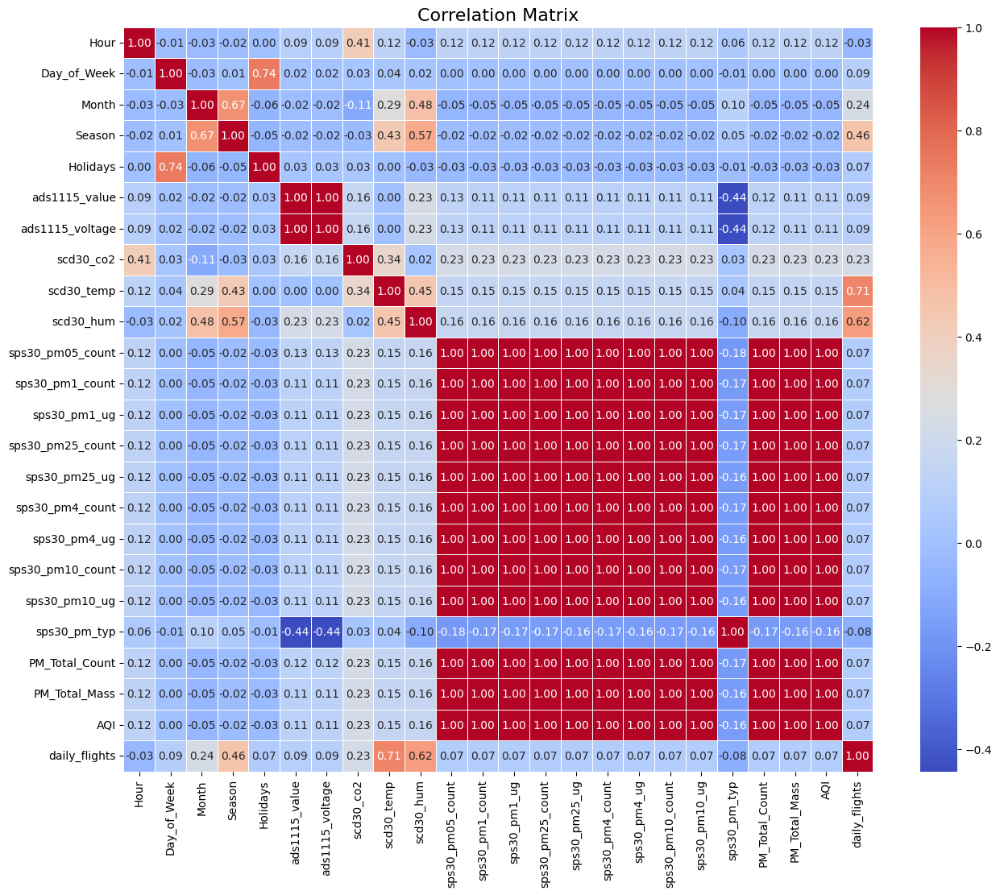

In [10]:
plt.figure(figsize=(15, 12))
sns.heatmap(
    df_combined_filtered.drop(columns=["node_id","ts_insertion","id_measure"]).corr(),
    annot=True, 
    cmap='coolwarm', 
    fmt=".2f",
    linewidths=0.5
)
plt.title("Correlation Matrix", fontsize=16)
plt.show()


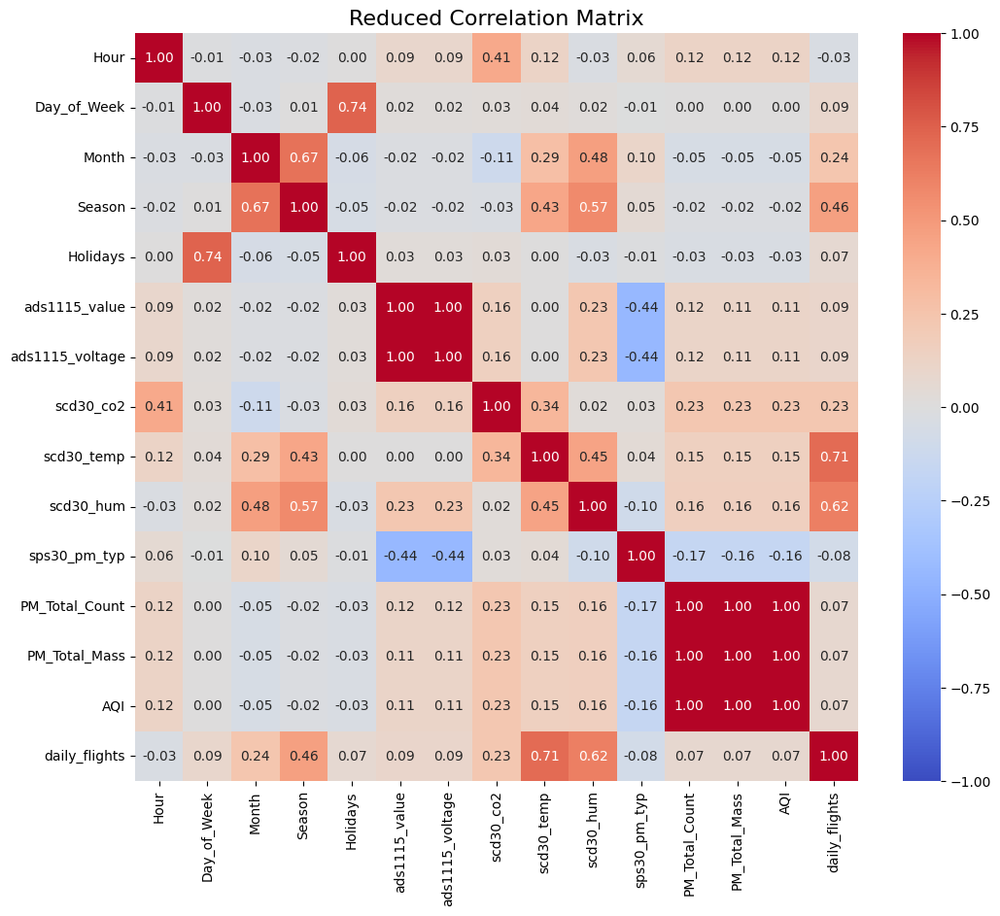

In [11]:
# Columns to exclude from the correlation matrix
columns_to_drop = [
    "sps30_pm05_count", "sps30_pm1_count", "sps30_pm1_ug",
    "sps30_pm25_count", "sps30_pm25_ug", "sps30_pm4_count",
    "sps30_pm4_ug", "sps30_pm10_count", "sps30_pm10_ug",
    "node_id", "ts_insertion", "id_measure"
]

# Calculating the correlation matrix without the excluded columns
reduced_corr_matrix = df_combined_filtered.drop(columns=columns_to_drop).corr()

# Plotting the new correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(reduced_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Reduced Correlation Matrix", fontsize=16)
plt.show()


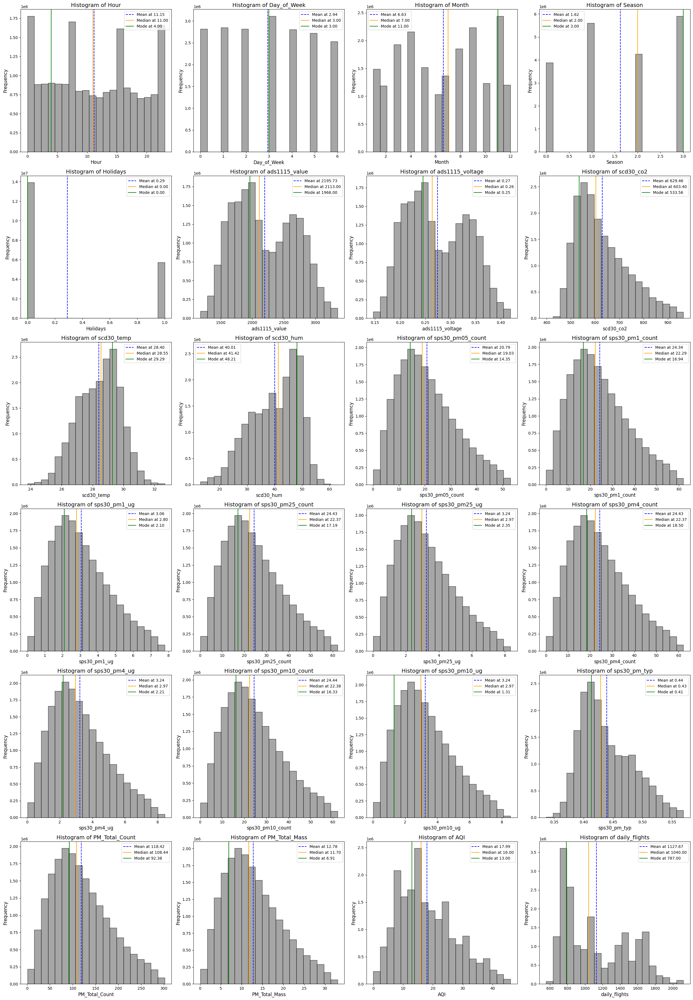

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy.stats as stats

numeric_columns = [
    col for col in df_combined_filtered.select_dtypes(include=[np.number]).columns
    if col not in ['id_measure']
]

n_cols = 4
n_rows = int(np.ceil(len(numeric_columns) / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, n_rows * 6))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    data = df_combined_filtered[column]
    
    axes[i].hist(data, bins=20, color='gray', alpha=0.7, edgecolor='black')
    
    mean = data.mean()
    median = data.median()
    mode = stats.mode(data, keepdims=True)[0][0]
    
    axes[i].axvline(mean, color='blue', linestyle='--', label=f'Mean at {mean:.2f}')
    axes[i].axvline(median, color='orange', linestyle='-', label=f'Median at {median:.2f}')
    axes[i].axvline(mode, color='green', linestyle='-', label=f'Mode at {mode:.2f}')
    
    axes[i].set_title(f'Histogram of {column}', fontsize=14)
    axes[i].set_xlabel(column, fontsize=12)
    axes[i].set_ylabel('Frequency', fontsize=12)
    axes[i].legend(fontsize=10)

for j in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

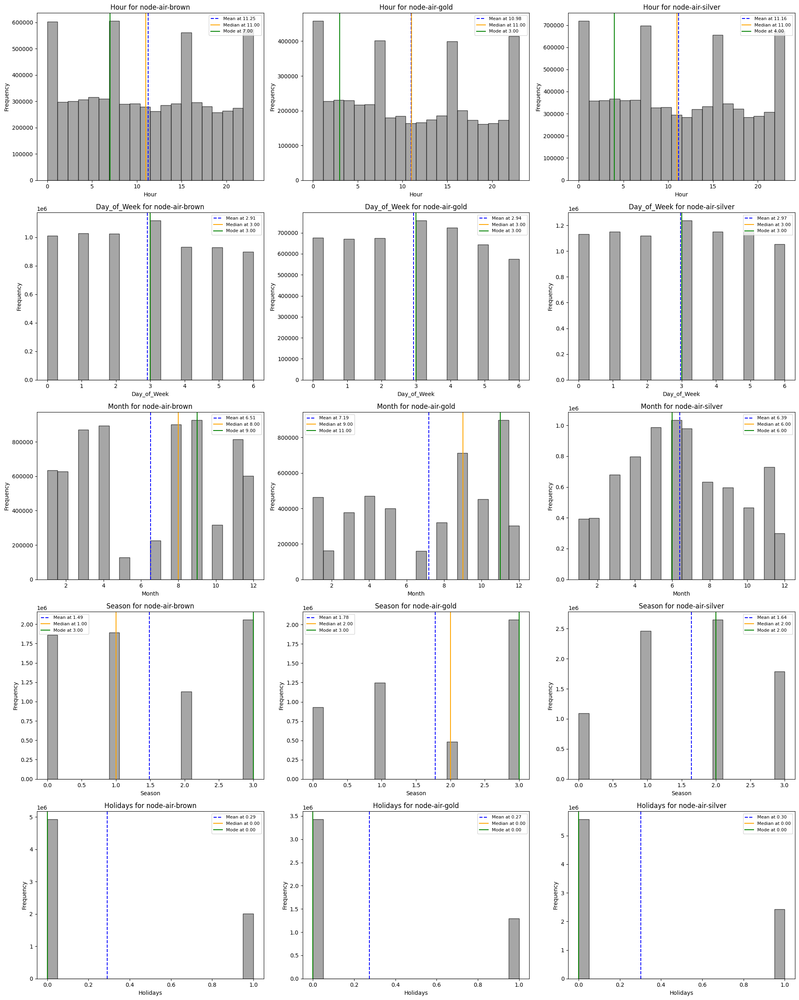

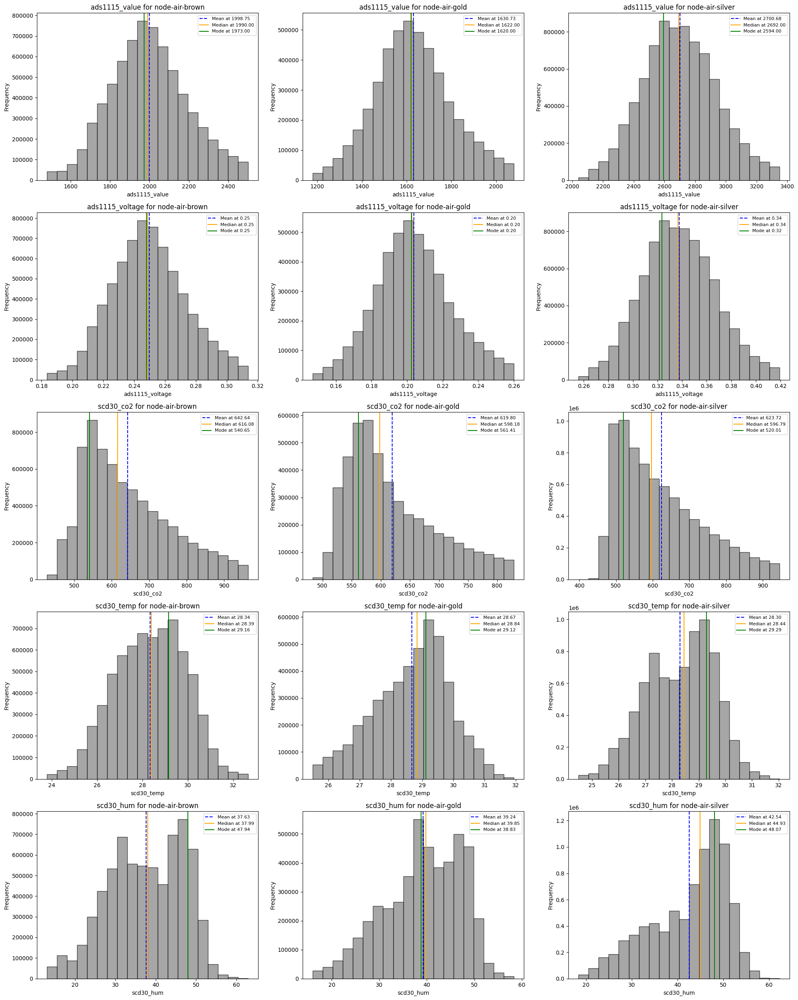

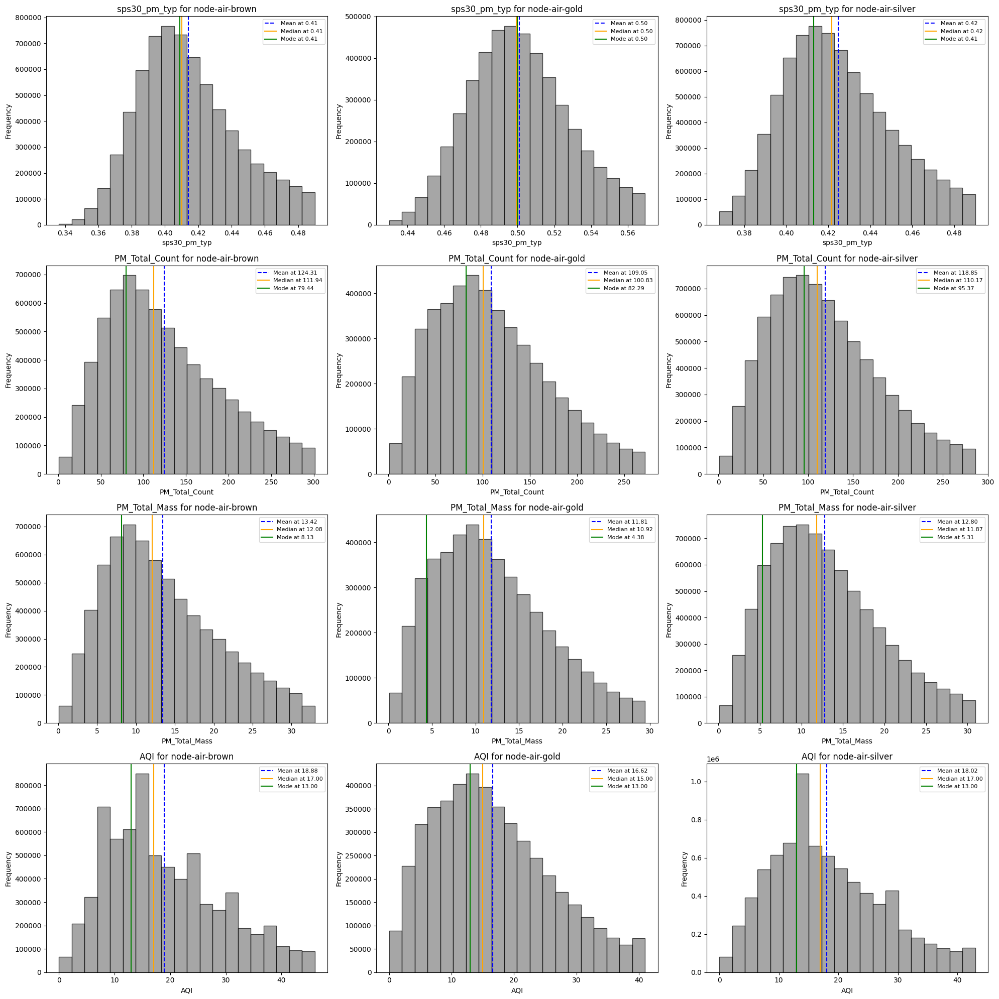

In [ ]:
import matplotlib.pyplot as plt 
import pandas as pd
import numpy as np
import scipy.stats as stats

columns = [
    col for col in df_combined_filtered.select_dtypes(include=[np.number]).columns
    if col not in ['id_measure', 'ts_insertion', 'daily_flights','sps30_pm05_count', 'sps30_pm1_count',
       'sps30_pm1_ug', 'sps30_pm25_count', 'sps30_pm25_ug', 'sps30_pm4_count',
       'sps30_pm4_ug', 'sps30_pm10_count', 'sps30_pm10_ug',]
]

node_ids = df_combined_filtered['node_id'].unique()

n_cols = 3
group_size = 5

for start_idx in range(0, len(columns), group_size):
    group_columns = columns[start_idx:start_idx + group_size]
    n_rows = len(group_columns)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
    axes = axes.flatten()
    
    for i, column in enumerate(group_columns):
        for j, node_id in enumerate(node_ids):
            node_data = df_combined_filtered[df_combined_filtered['node_id'] == node_id][column]
            
            ax = axes[i * n_cols + j]
            ax.hist(node_data, bins=20, color='gray', alpha=0.7, edgecolor='black')
            
            mean = node_data.mean()
            median = node_data.median()
            mode = stats.mode(node_data, keepdims=True)[0][0]
            
            ax.axvline(mean, color='blue', linestyle='--', label=f'Mean at {mean:.2f}')
            ax.axvline(median, color='orange', linestyle='-', label=f'Median at {median:.2f}')
            ax.axvline(mode, color='green', linestyle='-', label=f'Mode at {mode:.2f}')
            
            ax.set_title(f'{column} for {node_id}', fontsize=12)
            ax.set_xlabel(column, fontsize=10)
            ax.set_ylabel('Frequency', fontsize=10)
            ax.legend(fontsize=8)
    
    for k in range(len(group_columns) * n_cols, len(axes)):
        fig.delaxes(axes[k])
    
    plt.tight_layout()
    plt.show()

In [ ]:
unique_nodes = df_combined_filtered["node_id"].unique()

all_months = set(range(1, 13))

missing_months_by_node = {}

for node in unique_nodes:
    node_months = set(df_combined_filtered[df_combined_filtered["node_id"] == node]["Month"].unique())
    missing_months = all_months - node_months
    if missing_months:
        missing_months_by_node[node] = sorted(missing_months)

if missing_months_by_node:
    print("Nodes with missing months:")
    for node, missing_months in missing_months_by_node.items():
        print(f"Node ID: {node}, Missing Months: {missing_months}")
else:
    print("All nodes have data for all months.")

Nodes with missing months:
Node ID: node-air-brown, Missing Months: [6]
Node ID: node-air-gold, Missing Months: [6]


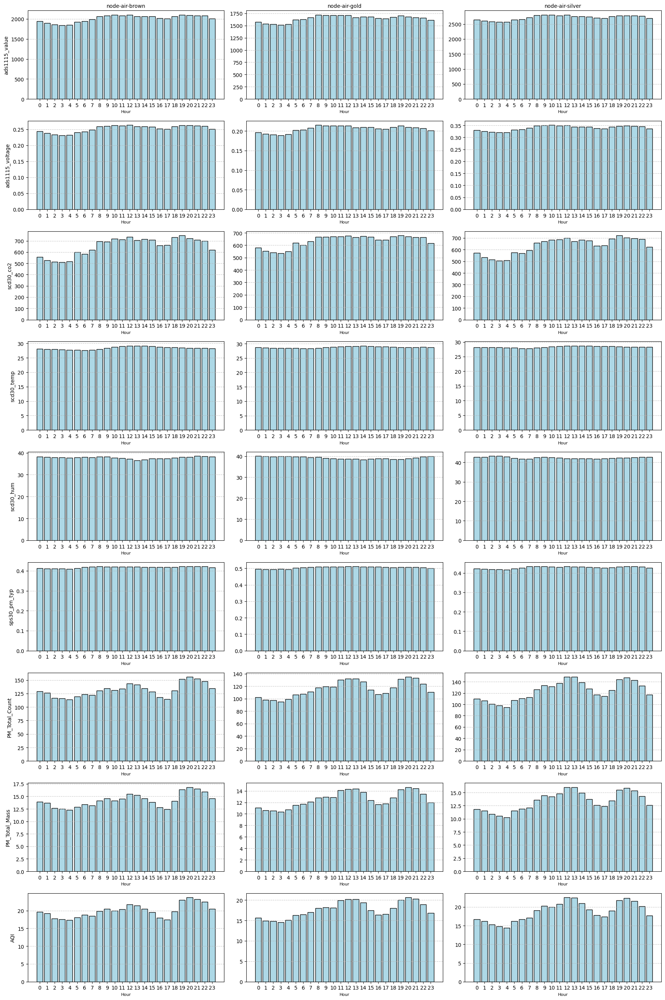

In [ ]:
import matplotlib.pyplot as plt

node_ids = hourly_avg_per_node.index.get_level_values('node_id').unique()

columns_to_plot = [
    'ads1115_value', 'ads1115_voltage', 'scd30_co2', 'scd30_temp',
    'scd30_hum', 'sps30_pm_typ', 'PM_Total_Count', 'PM_Total_Mass', 'AQI'
]

n_cols = len(node_ids)
n_rows = len(columns_to_plot)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 3))

for i, column in enumerate(columns_to_plot):
    for j, node_id in enumerate(node_ids):
        ax = axes[i, j] if n_rows > 1 else axes[j]
        
        node_data = hourly_avg_per_node.loc[node_id]
        hourly_data = node_data.groupby('Hour')[column].mean()
        
        ax.bar(hourly_data.index, hourly_data, color='lightblue', edgecolor='black')
        
        if i == 0:
            ax.set_title(f'{node_id}', fontsize=10)
        if j == 0:
            ax.set_ylabel(f'{column}', fontsize=10)
        ax.set_xlabel('Hour', fontsize=8)
        ax.set_xticks(range(24))
        ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

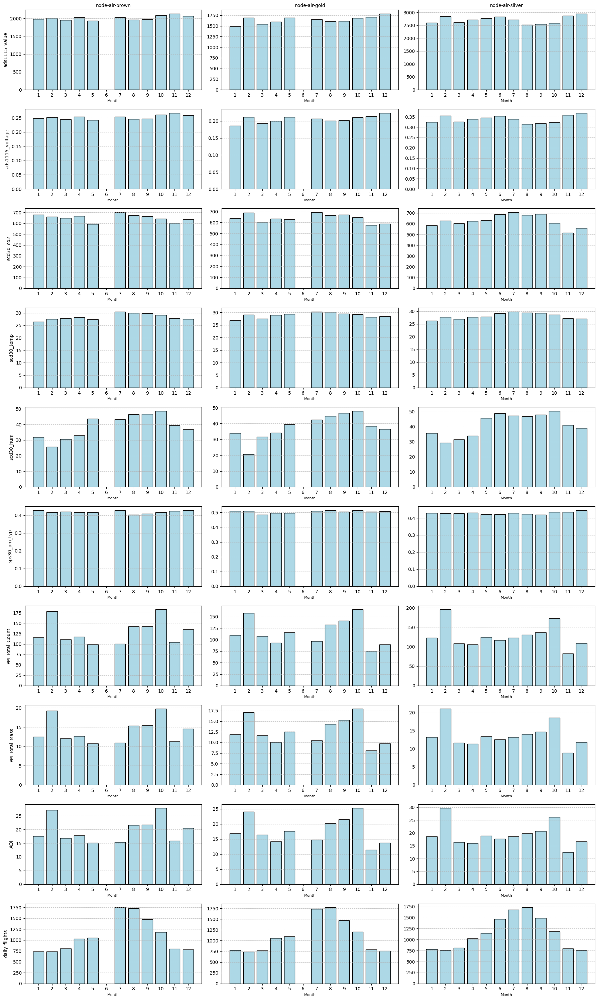

In [ ]:
import matplotlib.pyplot as plt

node_ids = hourly_avg_per_node.index.get_level_values('node_id').unique()

columns_to_plot = [
    'ads1115_value', 'ads1115_voltage', 'scd30_co2', 'scd30_temp',
    'scd30_hum', 'sps30_pm_typ', 'PM_Total_Count', 'PM_Total_Mass', 'AQI', 'daily_flights'
]

n_cols = len(node_ids)
n_rows = len(columns_to_plot)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 3))

for i, column in enumerate(columns_to_plot):
    for j, node_id in enumerate(node_ids):
        ax = axes[i, j] if n_rows > 1 else axes[j]
        
        node_data = hourly_avg_per_node.loc[node_id]
        monthly_data = node_data.groupby('Month')[column].mean()
        
        ax.bar(monthly_data.index, monthly_data, color='lightblue', edgecolor='black')
        
        if i == 0:
            ax.set_title(f'{node_id}', fontsize=10)
        if j == 0:
            ax.set_ylabel(f'{column}', fontsize=10)
        ax.set_xlabel('Month', fontsize=8)
        ax.set_xticks(range(1, 13))
        ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [18]:
df_combined_filtered

,id_measure,node_id,ts_insertion,Hour,Day_of_Week,Month,Season,Holidays,ads1115_value,ads1115_voltage,...,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,AQI,daily_flights
0,1,node-air-brown,2022-10-27 10:57:14,10,3,10,3,0,2015,0.25,...,6.69,50.50,6.69,50.51,6.69,0.42,244.93,26.39,37.00,959
1,2,node-air-brown,2022-10-27 10:57:17,10,3,10,3,0,1950,0.24,...,6.76,51.03,6.76,51.04,6.76,0.43,247.52,26.67,38.00,959
2,3,node-air-brown,2022-10-27 10:57:19,10,3,10,3,0,1995,0.25,...,6.86,51.79,6.86,51.80,6.86,0.43,251.18,27.07,38.00,959
3,4,node-air-brown,2022-10-27 10:57:21,10,3,10,3,0,2010,0.25,...,6.87,51.88,6.87,51.89,6.87,0.43,251.63,27.12,38.00,959
4,5,node-air-brown,2022-10-27 10:57:23,10,3,10,3,0,1993,0.25,...,6.91,52.13,6.91,52.14,6.91,0.43,252.83,27.25,38.00,959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19649475,11454424,node-air-silver,2023-10-13 08:04:18,8,4,10,3,0,2538,0.32,...,6.58,49.67,6.59,49.67,6.59,0.47,241.11,25.98,37.00,1290
19649476,11454425,node-air-silver,2023-10-13 08:04:20,8,4,10,3,0,2546,0.32,...,6.47,48.78,6.47,48.79,6.47,0.48,236.80,25.52,36.00,1290
19649477,11454426,node-air-silver,2023-10-13 08:04:22,8,4,10,3,0,2580,0.32,...,6.44,48.60,6.45,48.60,6.45,0.48,235.92,25.42,36.00,1290
19649478,11454427,node-air-silver,2023-10-13 08:04:25,8,4,10,3,0,2592,0.32,...,6.42,48.39,6.42,48.40,6.42,0.48,234.92,25.32,36.00,1290


In [10]:
from sklearn.model_selection import train_test_split

# Stratified Sampling by 'node_id'
sampled_df, _ = train_test_split(
    df_combined_filtered,
    test_size=0.999,
    stratify=df_combined_filtered['node_id'],
    random_state=42
)

print("Original Dataset Size:", df_combined_filtered.shape)
print("Sampled Dataset Size:", sampled_df.shape)


Original Dataset Size: (19649480, 27)
Sampled Dataset Size: (19649, 27)


In [ ]:
columns_to_compare = [
    'Month', 'Season', 'AQI', 'scd30_co2', 'ads1115_value', 
    'ads1115_voltage', 'scd30_temp', 'scd30_hum', 
    'sps30_pm_typ', 'PM_Total_Count', 'PM_Total_Mass', 'daily_flights'
]

pd.set_option('display.float_format', '{:.3f}'.format)

original_stats = df_combined_filtered[columns_to_compare].describe()

sampled_stats = sampled_df[columns_to_compare].describe()

print("Original Dataset Statistics:")
original_stats


Original Dataset Statistics:


,Month,Season,AQI,scd30_co2,ads1115_value,ads1115_voltage,scd30_temp,scd30_hum,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,daily_flights
count,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000
mean,6.627,1.620,17.990,629.458,2195.730,0.274,28.404,40.012,0.439,118.423,12.779,1127.668
std,3.414,1.110,9.603,108.964,487.879,0.061,1.372,8.855,0.045,63.235,6.818,369.336
min,1.000,0.000,0.000,397.930,1180.000,0.147,23.796,13.042,0.336,0.820,0.089,556.000
25%,4.000,1.000,11.000,545.445,1791.000,0.224,27.387,33.285,0.405,69.958,7.553,787.000
50%,7.000,2.000,16.000,603.397,2113.000,0.264,28.549,41.415,0.429,108.436,11.704,1040.000
75%,9.000,3.000,24.000,696.272,2620.000,0.328,29.401,47.376,0.471,158.974,17.155,1451.000
max,12.000,3.000,46.000,963.807,3350.000,0.419,32.653,62.913,0.569,301.364,33.005,2120.000


In [ ]:
print("\nSampled Dataset Statistics:")
sampled_stats


Sampled Dataset Statistics:


,Month,Season,AQI,scd30_co2,ads1115_value,ads1115_voltage,scd30_temp,scd30_hum,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,daily_flights
count,19649.000,19649.000,19649.000,19649.000,19649.000,19649.000,19649.000,19649.000,19649.000,19649.000,19649.000,19649.000
mean,6.630,1.618,18.002,630.002,2196.009,0.274,28.415,40.084,0.440,118.509,12.788,1131.104
std,3.412,1.110,9.679,108.612,488.120,0.061,1.369,8.828,0.045,63.721,6.869,369.206
min,1.000,0.000,1.000,431.581,1180.000,0.148,23.796,13.753,0.340,4.280,0.461,556.000
25%,4.000,1.000,11.000,546.529,1790.000,0.224,27.387,33.431,0.405,69.714,7.521,791.000
50%,7.000,2.000,16.000,604.376,2112.000,0.264,28.562,41.417,0.429,108.244,11.681,1041.000
75%,9.000,3.000,24.000,695.482,2620.000,0.328,29.414,47.398,0.471,159.275,17.188,1459.000
max,12.000,3.000,46.000,963.744,3349.000,0.419,32.627,59.522,0.569,301.168,32.456,2120.000


In [ ]:
def calculate_percentage_difference(original_value, sampled_value):
    return ((sampled_value - original_value) / original_value) * 100

percentage_diff = pd.DataFrame(index=['mean', 'std'], columns=columns_to_compare)

for column in columns_to_compare:
    for stat in ['mean', 'std']:
        original_value = original_stats.loc[stat, column]
        sampled_value = sampled_stats.loc[stat, column]
        percentage_diff.loc[stat, column] = calculate_percentage_difference(original_value, sampled_value)

print("\nPercentage Differences Between Variables (Mean and Std):")
percentage_diff


Percentage Differences Between Variables (Mean and Std):


,Month,Season,AQI,scd30_co2,ads1115_value,ads1115_voltage,scd30_temp,scd30_hum,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,daily_flights
mean,0.036,-0.146,0.066,0.087,0.013,0.012,0.037,0.179,0.095,0.073,0.073,0.305
std,-0.061,-0.034,0.791,-0.323,0.049,0.053,-0.219,-0.303,0.305,0.768,0.755,-0.035


In [14]:
sampled_df.to_csv('sampled_df.csv', index=False, sep=';')

In [4]:
sampled_df = pd.read_csv('sampled_df.csv', sep=';')

In [ ]:
import pandas as pd
from scipy.stats import anderson

variables_to_test = [
    'AQI', 'scd30_co2', 'ads1115_value', 'ads1115_voltage',
    'scd30_temp', 'scd30_hum', 'sps30_pm_typ',
    'PM_Total_Count', 'PM_Total_Mass', 'daily_flights'
]

for var in variables_to_test:
    data = sampled_df[var].dropna()
    result = anderson(data)
    print(f"Anderson-Darling Test for {var}:")
    print(f"Statistic: {result.statistic:.5f}")
    print("Critical Values and Significance Levels:")
    for i in range(len(result.critical_values)):
        sl, cv = result.significance_level[i], result.critical_values[i]
        print(f"  Significance Level {sl}%: Critical Value = {cv}")
    # Decision based on 5% significance level
    if result.statistic < result.critical_values[2]:  # Index 2 corresponds to 5%
        print(f"Result: {var} appears to be normally distributed at the 5% significance level.\n")
    else:
        print(f"Result: {var} does NOT appear to be normally distributed at the 5% significance level.\n")


Anderson-Darling Test for AQI:
Statistic: 198.61183
Critical Values and Significance Levels:
  Significance Level 15.0%: Critical Value = 0.576
  Significance Level 10.0%: Critical Value = 0.656
  Significance Level 5.0%: Critical Value = 0.787
  Significance Level 2.5%: Critical Value = 0.918
  Significance Level 1.0%: Critical Value = 1.092
Result: AQI does NOT appear to be normally distributed at the 5% significance level.

Anderson-Darling Test for scd30_co2:
Statistic: 364.45018
Critical Values and Significance Levels:
  Significance Level 15.0%: Critical Value = 0.576
  Significance Level 10.0%: Critical Value = 0.656
  Significance Level 5.0%: Critical Value = 0.787
  Significance Level 2.5%: Critical Value = 0.918
  Significance Level 1.0%: Critical Value = 1.092
Result: scd30_co2 does NOT appear to be normally distributed at the 5% significance level.

Anderson-Darling Test for ads1115_value:
Statistic: 235.13522
Critical Values and Significance Levels:
  Significance Level 15

In [6]:
import pandas as pd
from scipy.stats import kruskal, mannwhitneyu

In [ ]:
# Hypotheses:
# H₀: AQI does not vary significantly between nodes.
# H₁: AQI varies significantly between nodes.

# AQI data by node
aqi_by_node = [sampled_df[sampled_df['node_id'] == node]['AQI'] for node in sampled_df['node_id'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*aqi_by_node)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - AQI by Node:")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: AQI varies significantly between nodes.")
else:
    print("\nResult: Fail to reject H₀: AQI does not vary significantly between nodes.")


Kruskal-Wallis Test Results - AQI by Node:
Test Statistic: 117.33842432316838, p-value: 3.3134841738169607e-26

Result: Reject H₀: AQI varies significantly between nodes.


In [20]:
# Hypotheses:
# H₀: CO2 levels do not vary significantly between nodes.
# H₁: CO2 levels vary significantly between nodes.

# CO2 data by node
co2_by_node = [sampled_df[sampled_df['node_id'] == node]['scd30_co2'] for node in sampled_df['node_id'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*co2_by_node)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - CO2 Levels by Node:")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: CO2 levels vary significantly between nodes.")
else:
    print("\nResult: Fail to reject H₀: CO2 levels do not vary significantly between nodes.")


Kruskal-Wallis Test Results - CO2 Levels by Node:
Test Statistic: 107.16815878708358, p-value: 5.354636592127099e-24

Result: Reject H₀: CO2 levels vary significantly between nodes.


In [21]:
# Hypotheses:
# H₀: Particulate count (PM_Total_Count) does not vary significantly between nodes.
# H₁: Particulate count (PM_Total_Count) varies significantly between nodes.

# Particulate count data by node
pm_count_by_node = [sampled_df[sampled_df['node_id'] == node]['PM_Total_Count'] for node in sampled_df['node_id'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*pm_count_by_node)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - Particulate Count by Node:")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: Particulate count varies significantly between nodes.")
else:
    print("\nResult: Fail to reject H₀: Particulate count does not vary significantly between nodes.")


Kruskal-Wallis Test Results - Particulate Count by Node:
Test Statistic: 124.93125621326634, p-value: 7.439134394120346e-28

Result: Reject H₀: Particulate count varies significantly between nodes.


In [22]:
# Hypotheses:
# H₀: Particulate mass (PM_Total_Mass) does not vary significantly between nodes.
# H₁: Particulate mass (PM_Total_Mass) varies significantly between nodes.

# Particulate mass data by node
pm_mass_by_node = [sampled_df[sampled_df['node_id'] == node]['PM_Total_Mass'] for node in sampled_df['node_id'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*pm_mass_by_node)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - Particulate Mass by Node:")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: Particulate mass varies significantly between nodes.")
else:
    print("\nResult: Fail to reject H₀: Particulate mass does not vary significantly between nodes.")


Kruskal-Wallis Test Results - Particulate Mass by Node:
Test Statistic: 117.92111248774626, p-value: 2.4760292643876144e-26

Result: Reject H₀: Particulate mass varies significantly between nodes.


In [15]:
# Hypotheses:
# H₀: Gas concentration (ads1115_value) does not vary significantly between nodes.
# H₁: Gas concentration (ads1115_value) varies significantly between nodes.

# Gas concentration data by node
gas_value_by_node = [sampled_df[sampled_df['node_id'] == node]['ads1115_value'] for node in sampled_df['node_id'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*gas_value_by_node)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - Gas Concentration by Node:")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: Gas concentration varies significantly between nodes.")
else:
    print("\nResult: Fail to reject H₀: Gas concentration does not vary significantly between nodes.")


Kruskal-Wallis Test Results - Gas Concentration by Node:
Test Statistic: 16073.371412791626, p-value: 0.0

Result: Reject H₀: Gas concentration varies significantly between nodes.


In [16]:
# Hypotheses:
# H₀: Temperature does not vary significantly between nodes.
# H₁: Temperature varies significantly between nodes.

# Temperature data by node
temp_by_node = [sampled_df[sampled_df['node_id'] == node]['scd30_temp'] for node in sampled_df['node_id'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*temp_by_node)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - Temperature by Node:")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: Temperature varies significantly between nodes.")
else:
    print("\nResult: Fail to reject H₀: Temperature does not vary significantly between nodes.")


Kruskal-Wallis Test Results - Temperature by Node:
Test Statistic: 188.12929210082055, p-value: 1.4068353684206225e-41

Result: Reject H₀: Temperature varies significantly between nodes.


In [17]:
# Hypotheses:
# H₀: Humidity does not vary significantly between nodes.
# H₁: Humidity varies significantly between nodes.

# Humidity data by node
hum_by_node = [sampled_df[sampled_df['node_id'] == node]['scd30_hum'] for node in sampled_df['node_id'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*hum_by_node)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - Humidity by Node:")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: Humidity varies significantly between nodes.")
else:
    print("\nResult: Fail to reject H₀: Humidity does not vary significantly between nodes.")


Kruskal-Wallis Test Results - Humidity by Node:
Test Statistic: 1270.6522594991893, p-value: 1.206056464380871e-276

Result: Reject H₀: Humidity varies significantly between nodes.


In [8]:
# Hypotheses:
# H₀: There is no significant difference in temperature (`scd30_temp`) across different hours.
# H₁: There is a significant difference in temperature (`scd30_temp`) across different hours.

# Grouped data by hours
scd30_temp_hours = [sampled_df[sampled_df['Hour'] == hour]['scd30_temp'] for hour in sampled_df['Hour'].unique()]

# Perform Kruskal-Wallis test
stat, p_value = kruskal(*scd30_temp_hours)

print(f"Kruskal-Wallis Test for scd30_temp by Hours:")
print(f"Test Statistic: {stat}, p-value: {p_value}")
if p_value < 0.05:
    print("Result: Reject H₀ - Significant difference detected.\n")
else:
    print("Result: Fail to reject H₀ - No significant difference detected.\n")

Kruskal-Wallis Test for scd30_temp by Hours:
Test Statistic: 892.9670888372735, p-value: 7.118742345158204e-174
Result: Reject H₀ - Significant difference detected.



In [9]:
# Hypotheses:
# H₀: There is no significant difference in humidity (`scd30_hum`) across different hours.
# H₁: There is a significant difference in humidity (`scd30_hum`) across different hours.

# Grouped data by hours
scd30_hum_hours = [sampled_df[sampled_df['Hour'] == hour]['scd30_hum'] for hour in sampled_df['Hour'].unique()]

# Perform Kruskal-Wallis test
stat, p_value = kruskal(*scd30_hum_hours)

print(f"Kruskal-Wallis Test for scd30_hum by Hours:")
print(f"Test Statistic: {stat}, p-value: {p_value}")
if p_value < 0.05:
    print("Result: Reject H₀ - Significant difference detected.\n")
else:
    print("Result: Fail to reject H₀ - No significant difference detected.\n")


Kruskal-Wallis Test for scd30_hum by Hours:
Test Statistic: 90.3194966973984, p-value: 6.282518957833506e-10
Result: Reject H₀ - Significant difference detected.



In [23]:
# Hypotheses:
# H₀: CO2 concentration does not vary by hour of the day.
# H₁: CO2 concentration varies significantly by hour of the day.

# CO2 data by hour (sampled data)
hourly_co2_data_sampled = [sampled_df[sampled_df['Hour'] == hour]['scd30_co2']
                           for hour in sampled_df['Hour'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*hourly_co2_data_sampled)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - CO2 Concentration by Hour of the Day (Sampled Data):")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: CO2 concentration varies significantly by hour of the day.")
else:
    print("\nResult: Fail to reject H₀: CO2 concentration does not vary by hour of the day.")


Kruskal-Wallis Test Results - CO2 Concentration by Hour of the Day (Sampled Data):
Test Statistic: 7636.738512928419, p-value: 0.0

Result: Reject H₀: CO2 concentration varies significantly by hour of the day.


In [26]:
# Hypotheses:
# H₀: AQI does not vary by hour of the day.
# H₁: AQI varies significantly by hour of the day.

# AQI data by hour (sampled data)
hourly_aqi_data_sampled = [sampled_df[sampled_df['Hour'] == hour]['AQI']
                           for hour in sampled_df['Hour'].unique()]

# Kruskal-Wallis Test
stat, p_value = kruskal(*hourly_aqi_data_sampled)

# Print results and interpret
print(f"Kruskal-Wallis Test Results - AQI by Hour (Sampled Data):")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: AQI varies significantly by hour of the day.")
else:
    print("\nResult: Fail to reject H₀: AQI does not vary by hour of the day.")


Kruskal-Wallis Test Results - AQI by Hour (Sampled Data):
Test Statistic: 755.9872501618145, p-value: 6.913796744254582e-145

Result: Reject H₀: AQI varies significantly by hour of the day.


In [10]:
# Hypotheses:
# H₀: There is no significant difference in temperature (`scd30_temp`) across different months.
# H₁: There is a significant difference in temperature (`scd30_temp`) across different months.

# Grouped data by month
scd30_temp_month = [sampled_df[sampled_df['Month'] == month]['scd30_temp'] for month in sampled_df['Month'].unique()]

# Perform Kruskal-Wallis test
stat, p_value = kruskal(*scd30_temp_month)

print(f"Kruskal-Wallis Test for scd30_temp by Month:")
print(f"Test Statistic: {stat}, p-value: {p_value}")
if p_value < 0.05:
    print("Result: Reject H₀ - Significant difference detected.\n")
else:
    print("Result: Fail to reject H₀ - No significant difference detected.\n")


Kruskal-Wallis Test for scd30_temp by Month:
Test Statistic: 11155.31199599862, p-value: 0.0
Result: Reject H₀ - Significant difference detected.



In [11]:
# Hypotheses:
# H₀: There is no significant difference in humidity (`scd30_hum`) across different months.
# H₁: There is a significant difference in humidity (`scd30_hum`) across different months.

# Grouped data by month
scd30_hum_month = [sampled_df[sampled_df['Month'] == month]['scd30_hum'] for month in sampled_df['Month'].unique()]

# Perform Kruskal-Wallis test
stat, p_value = kruskal(*scd30_hum_month)

print(f"Kruskal-Wallis Test for scd30_hum by Month:")
print(f"Test Statistic: {stat}, p-value: {p_value}")
if p_value < 0.05:
    print("Result: Reject H₀ - Significant difference detected.\n")
else:
    print("Result: Fail to reject H₀ - No significant difference detected.\n")


Kruskal-Wallis Test for scd30_hum by Month:
Test Statistic: 13014.878467104068, p-value: 0.0
Result: Reject H₀ - Significant difference detected.



In [12]:
# Hypotheses:
# H₀: There is no significant difference in CO2 levels (`scd30_co2`) across different months.
# H₁: There is a significant difference in CO2 levels (`scd30_co2`) across different months.

# Grouped data by month
scd30_co2_month = [sampled_df[sampled_df['Month'] == month]['scd30_co2'] for month in sampled_df['Month'].unique()]

# Perform Kruskal-Wallis test
stat, p_value = kruskal(*scd30_co2_month)

print(f"Kruskal-Wallis Test for scd30_co2 by Month:")
print(f"Test Statistic: {stat}, p-value: {p_value}")
if p_value < 0.05:
    print("Result: Reject H₀ - Significant difference detected.\n")
else:
    print("Result: Fail to reject H₀ - No significant difference detected.\n")


Kruskal-Wallis Test for scd30_co2 by Month:
Test Statistic: 1656.6306819761041, p-value: 0.0
Result: Reject H₀ - Significant difference detected.



In [13]:
# Hypotheses:
# H₀: There is no significant difference in AQI across different months.
# H₁: There is a significant difference in AQI across different months.

# Grouped data by month
AQI_month = [sampled_df[sampled_df['Month'] == month]['AQI'] for month in sampled_df['Month'].unique()]

# Perform Kruskal-Wallis test
stat, p_value = kruskal(*AQI_month)

print(f"Kruskal-Wallis Test for AQI by Month:")
print(f"Test Statistic: {stat}, p-value: {p_value}")
if p_value < 0.05:
    print("Result: Reject H₀ - Significant difference detected.\n")
else:
    print("Result: Fail to reject H₀ - No significant difference detected.\n")


Kruskal-Wallis Test for AQI by Month:
Test Statistic: 2268.397544954654, p-value: 0.0
Result: Reject H₀ - Significant difference detected.



In [14]:
# Hypotheses:
# H₀: There is no significant difference in daily flights across different months.
# H₁: There is a significant difference in daily flights across different months.

# Grouped data by month
daily_flights_month = [sampled_df[sampled_df['Month'] == month]['daily_flights'] for month in sampled_df['Month'].unique()]

# Perform Kruskal-Wallis test
stat, p_value = kruskal(*daily_flights_month)

print(f"Kruskal-Wallis Test for daily_flights by Month:")
print(f"Test Statistic: {stat}, p-value: {p_value}")
if p_value < 0.05:
    print("Result: Reject H₀ - Significant difference detected.\n")
else:
    print("Result: Fail to reject H₀ - No significant difference detected.\n")


Kruskal-Wallis Test for daily_flights by Month:
Test Statistic: 17787.847535533492, p-value: 0.0
Result: Reject H₀ - Significant difference detected.



In [24]:
# Hypotheses:
# H₀: There is no significant difference in AQI between holiday and non-holiday days.
# H₁: There is a significant difference in AQI between holiday and non-holiday days.

# Filter data for holiday and non-holiday days (using the sampled data)
holiday_data_sampled = sampled_df[sampled_df['Holidays'] == 1]['AQI']
non_holiday_data_sampled = sampled_df[sampled_df['Holidays'] == 0]['AQI']

# Mann-Whitney U Test
stat, p_value = mannwhitneyu(holiday_data_sampled, non_holiday_data_sampled)

# Print results and interpret
print(f"Mann-Whitney U Test Results - AQI and Holiday Days (Sampled Data):")
print(f"Test Statistic: {stat}, p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: There is a significant difference in AQI between holiday and non-holiday days.")
else:
    print("\nResult: Fail to reject H₀: There is no significant difference in AQI between holiday and non-holiday days.")


Mann-Whitney U Test Results - AQI and Holiday Days (Sampled Data):
Test Statistic: 38371355.5, p-value: 4.0556931774937144e-05

Result: Reject H₀: There is a significant difference in AQI between holiday and non-holiday days.


In [7]:
# Hypotheses:
# H₀: There is no significant difference in CO2 concentration between holiday and non-holiday days.
# H₁: There is a significant difference in CO2 concentration between holiday and non-holiday days.

# Filter data for holiday and non-holiday days
holiday_co2 = sampled_df[sampled_df['Holidays'] == 1]['scd30_co2']
non_holiday_co2 = sampled_df[sampled_df['Holidays'] == 0]['scd30_co2']

# Perform Mann-Whitney U Test
stat, p_value = mannwhitneyu(holiday_co2, non_holiday_co2)

# Print results and interpretation
print(f"Mann-Whitney U Test Results - CO2 Levels on Holiday vs. Non-Holiday Days:")
print(f"Test Statistic: {stat}")
print(f"p-value: {p_value}")

if p_value < 0.05:
    print("\nResult: Reject H₀: There is a significant difference in CO2 concentration between holiday and non-holiday days.")
else:
    print("\nResult: Fail to reject H₀: There is no significant difference in CO2 concentration between holiday and non-holiday days.")

Mann-Whitney U Test Results - CO2 Levels on Holiday vs. Non-Holiday Days:
Test Statistic: 41051378.5
p-value: 0.0009127996376625888

Result: Reject H₀: There is a significant difference in CO2 concentration between holiday and non-holiday days.


In [15]:
# Hypotheses:
# H₀: There is no significant difference in daily flight counts between holiday and non-holiday days.
# H₁: There is a significant difference in daily flight counts between holiday and non-holiday days.

# Filter data for holiday and non-holiday days
holiday_flights = sampled_df[sampled_df['Holidays'] == 1]['daily_flights']
non_holiday_flights = sampled_df[sampled_df['Holidays'] == 0]['daily_flights']

# Perform Mann-Whitney U Test
stat, p_value = mannwhitneyu(holiday_flights, non_holiday_flights)

# Print results and interpretation
print("Mann-Whitney U Test Results - Daily Flights (Holidays vs. Non-Holidays):")
print(f"Test Statistic: {stat}")
print(f"p-value: {p_value}")

if p_value < 0.05:
    print("Result: Reject H₀. Significant difference in daily flight counts between holiday and non-holiday days.\n")
else:
    print("Result: Fail to reject H₀. No significant difference in daily flight counts between holiday and non-holiday days.\n")


Mann-Whitney U Test Results - Daily Flights (Holidays vs. Non-Holidays):
Test Statistic: 44169591.5
p-value: 6.696775040641199e-33
Result: Reject H₀. Significant difference in daily flight counts between holiday and non-holiday days.



In [5]:
from scipy.stats import spearmanr

In [6]:
def spearman_test_and_plot(df, pairs, description): 
    print(f"\n==== {description} ====\n")
    for x, y in pairs:
        # Spearman Correlation
        spearman_stat, spearman_p = spearmanr(df[x], df[y])
        print(f"Spearman Correlation Test: {x} vs {y}")
        print(f"Statistic: {spearman_stat:.3f}, p-value: {spearman_p:.3e}")
        if spearman_p < 0.05:
            print("Result: Reject H0. There is a significant monotonic relationship.\n")
        else:
            print("Result: Fail to reject H0. No significant monotonic relationship.\n")
        
        # Scatter Plot
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[x], y=df[y], alpha=0.7)
        plt.title(f"Scatter Plot of {x} vs {y}", fontsize=18)
        plt.xlabel(x, fontsize=14)
        plt.ylabel(y, fontsize=14)
        plt.grid(alpha=0.6, linestyle="--")
        plt.show()

In [ ]:
correlation_pairs = [
    ("scd30_co2", "Hour"),              # CO2 and Hour
    ("scd30_temp", "Month"),            # Temperature and Month
    ("scd30_temp", "Season"),           # Temperature and Season
    ("scd30_hum", "Month"),             # Humidity and Month
    ("scd30_hum", "Season"),            # Humidity and Season
    ("daily_flights", "Month"),         # Flights and Month
    ("daily_flights", "Season"),        # Flights and Season
    ("scd30_hum", "ads1115_value"),     # Humidity and Sensor Value
    ("scd30_hum", "ads1115_voltage"),   # Humidity and Sensor Voltage
    ("scd30_temp", "scd30_co2"),        # Temperature and CO2
    ("scd30_co2", "PM_Total_Count"),    # CO2 and PM Total Count
    ("scd30_co2", "PM_Total_Mass"),     # CO2 and PM Total Mass
    ("scd30_co2", "AQI"),               # CO2 and AQI
    ("scd30_co2", "daily_flights"),     # CO2 and Flights
    ("scd30_hum", "scd30_temp"),        # Humidity and Temperature
    ("daily_flights", "scd30_temp"),    # Flights and Temperature
    ("daily_flights", "scd30_hum"),     # Flights and Humidity
    ("sps30_pm_typ", "ads1115_value"),  # PM Typical and Sensor Value
    ("sps30_pm_typ", "ads1115_voltage") # PM Typical and Sensor Voltage
]




==== Correlation Analysis for Selected Variable Pairs ====

Spearman Correlation Test: scd30_co2 vs Hour
Statistic: 0.458, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



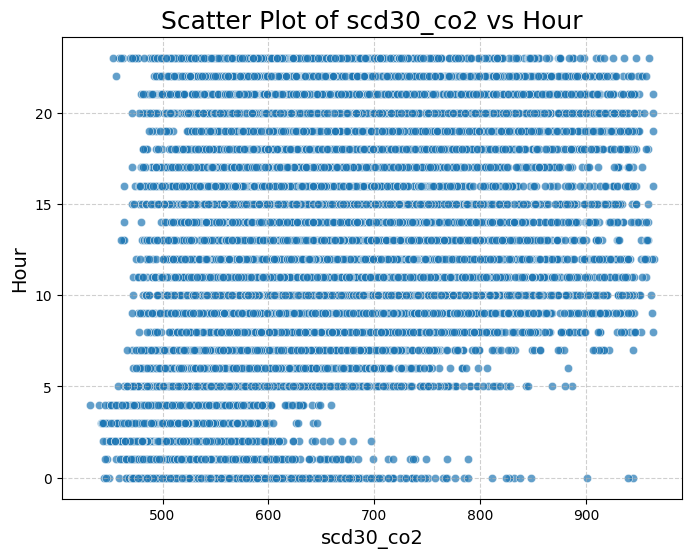

Spearman Correlation Test: scd30_temp vs Month
Statistic: 0.248, p-value: 1.591e-272
Result: Reject H0. There is a significant monotonic relationship.



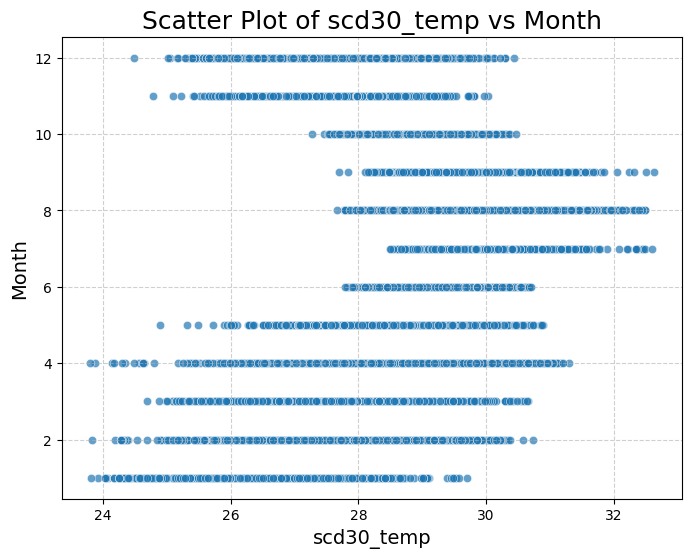

Spearman Correlation Test: scd30_temp vs Season
Statistic: 0.431, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



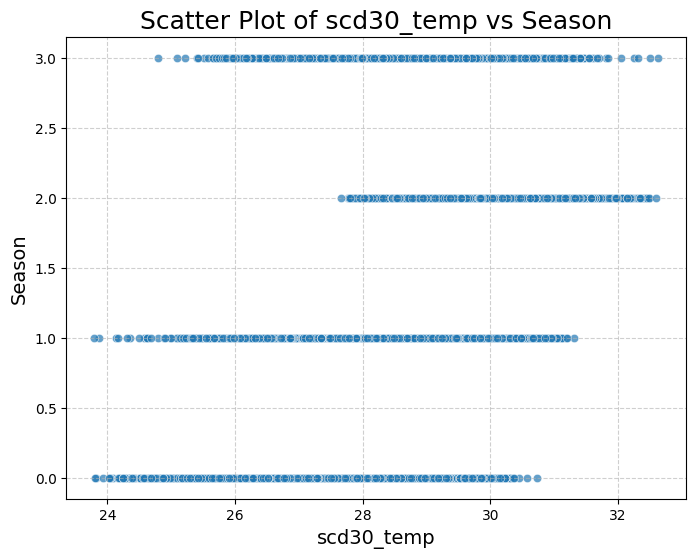

Spearman Correlation Test: scd30_hum vs Month
Statistic: 0.450, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



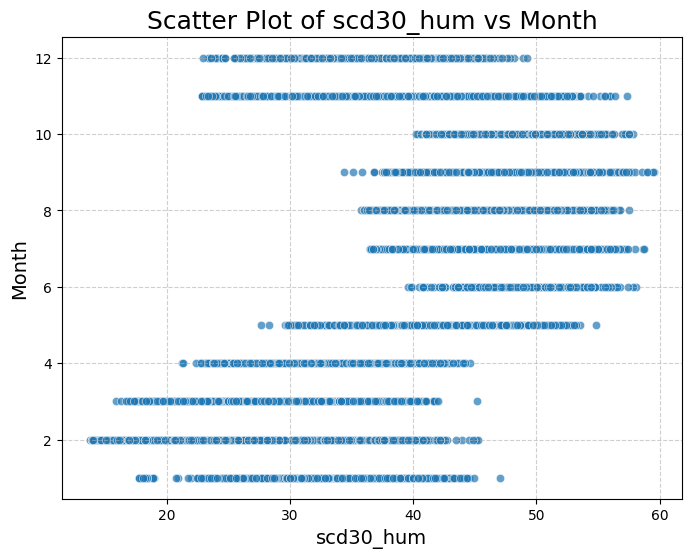

Spearman Correlation Test: scd30_hum vs Season
Statistic: 0.580, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



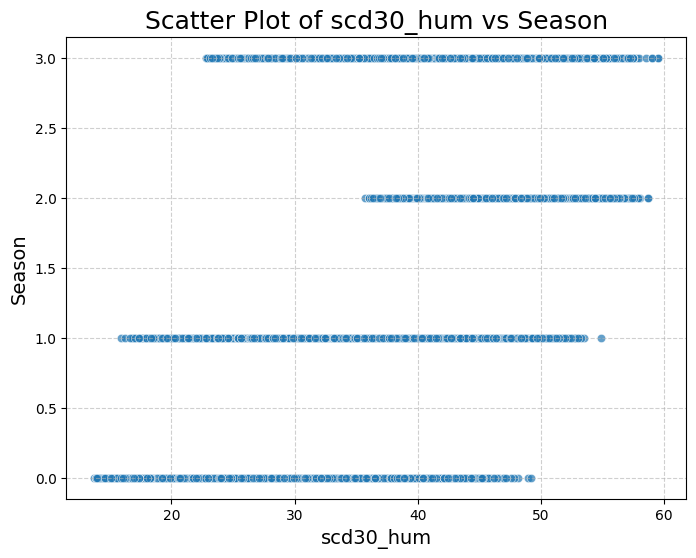

Spearman Correlation Test: daily_flights vs Month
Statistic: 0.195, p-value: 3.233e-168
Result: Reject H0. There is a significant monotonic relationship.



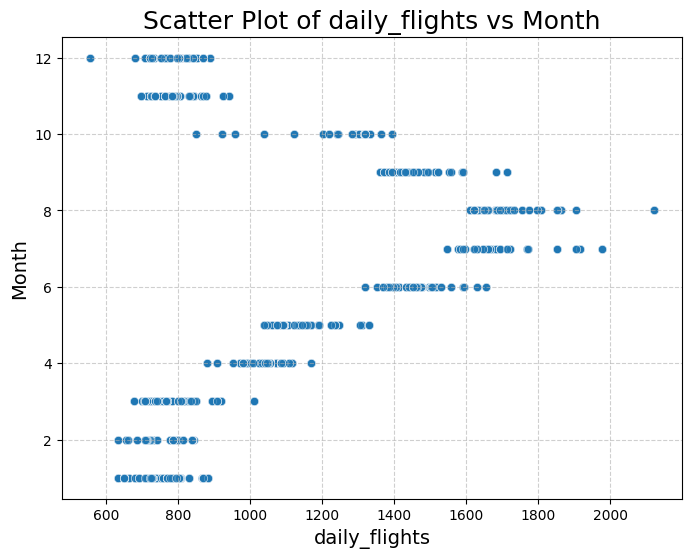

Spearman Correlation Test: daily_flights vs Season
Statistic: 0.462, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



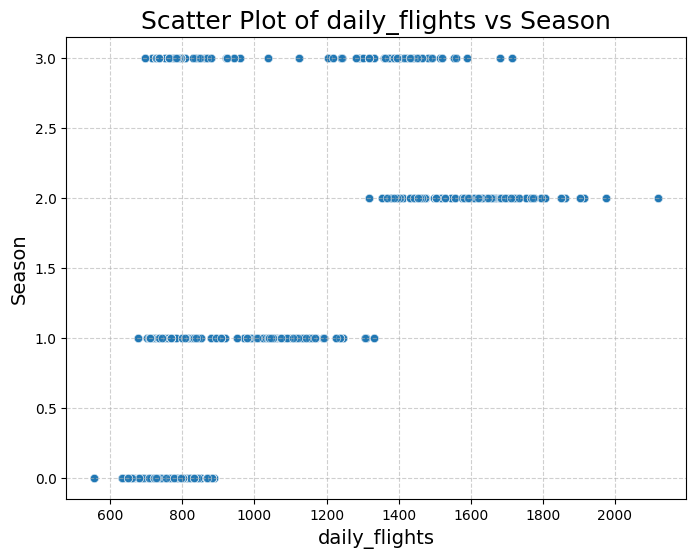

Spearman Correlation Test: scd30_hum vs ads1115_value
Statistic: 0.244, p-value: 3.924e-263
Result: Reject H0. There is a significant monotonic relationship.



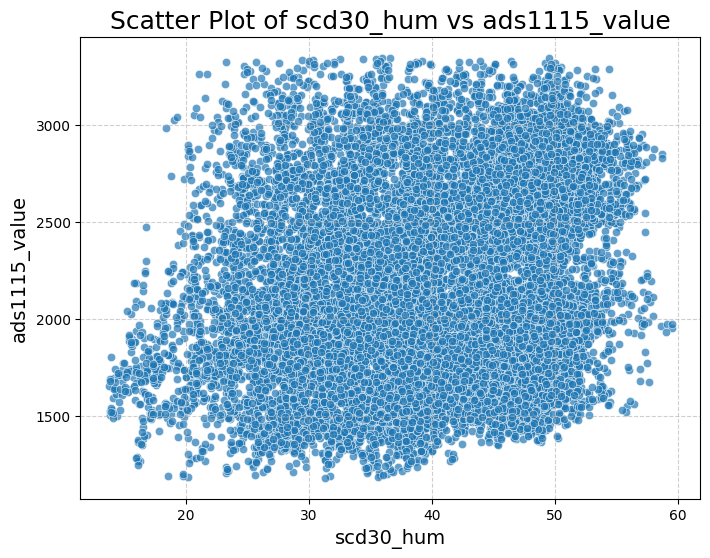

Spearman Correlation Test: scd30_hum vs ads1115_voltage
Statistic: 0.244, p-value: 3.421e-263
Result: Reject H0. There is a significant monotonic relationship.



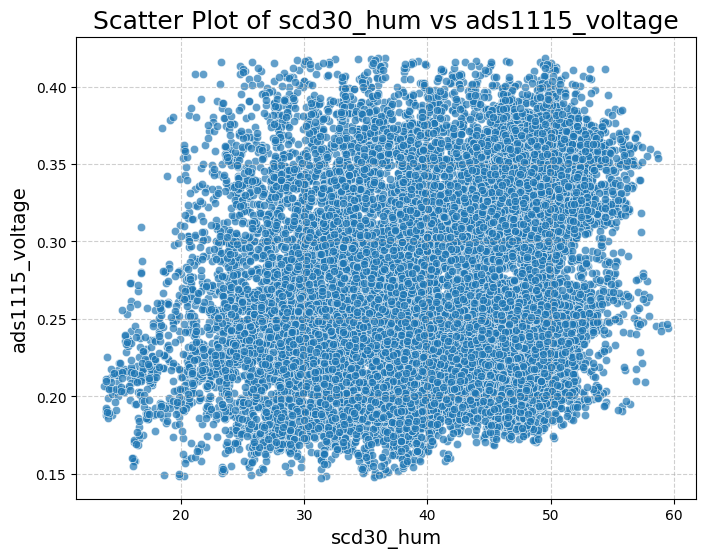

Spearman Correlation Test: scd30_temp vs scd30_co2
Statistic: 0.337, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



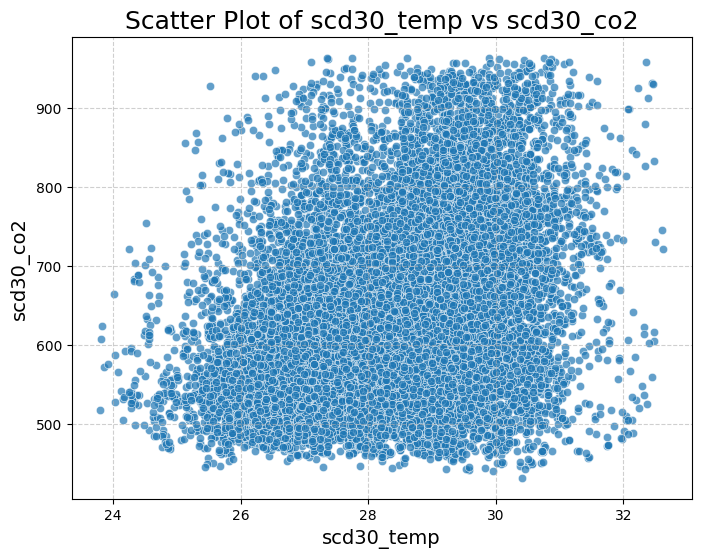

Spearman Correlation Test: scd30_co2 vs PM_Total_Count
Statistic: 0.250, p-value: 4.232e-278
Result: Reject H0. There is a significant monotonic relationship.



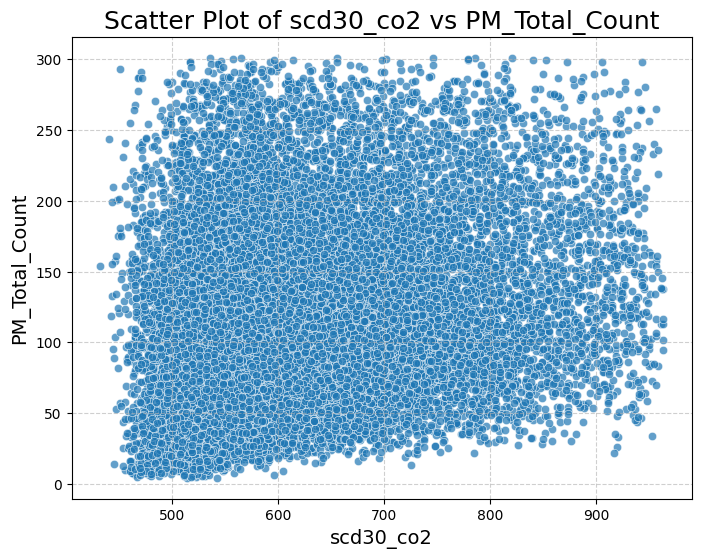

Spearman Correlation Test: scd30_co2 vs PM_Total_Mass
Statistic: 0.250, p-value: 1.905e-278
Result: Reject H0. There is a significant monotonic relationship.



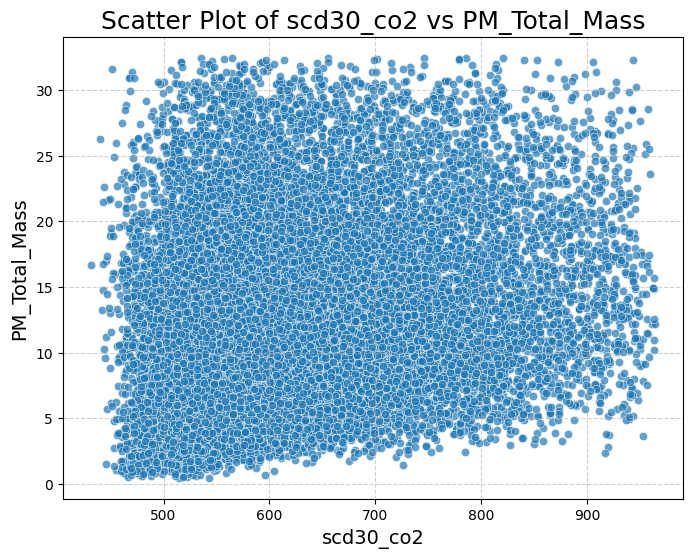

Spearman Correlation Test: scd30_co2 vs AQI
Statistic: 0.250, p-value: 8.692e-278
Result: Reject H0. There is a significant monotonic relationship.



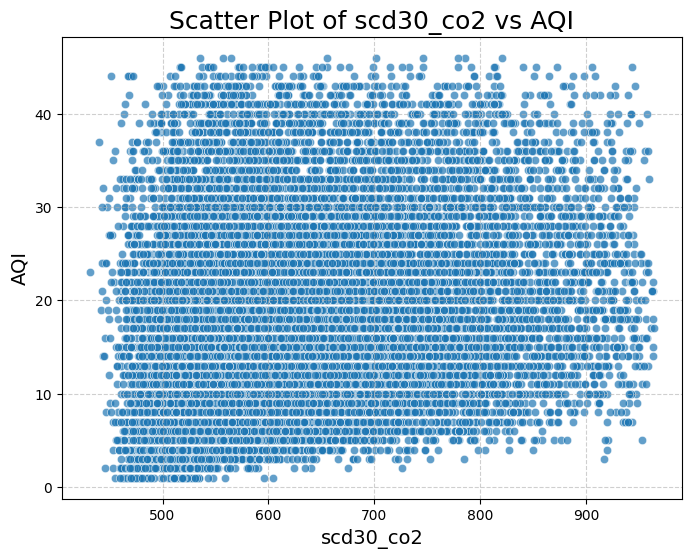

Spearman Correlation Test: scd30_co2 vs daily_flights
Statistic: 0.199, p-value: 1.336e-174
Result: Reject H0. There is a significant monotonic relationship.



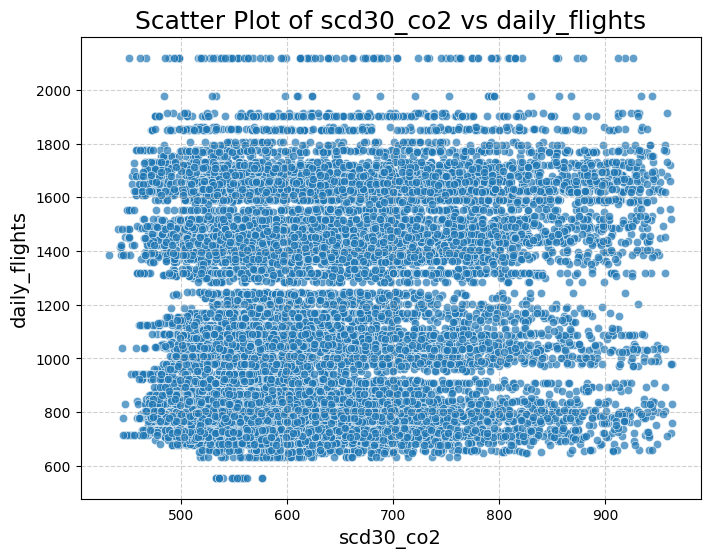

Spearman Correlation Test: scd30_hum vs scd30_temp
Statistic: 0.484, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



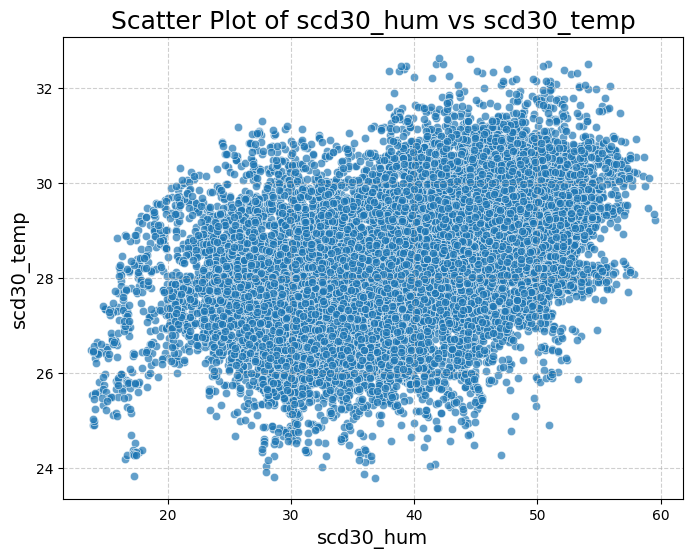

Spearman Correlation Test: daily_flights vs scd30_temp
Statistic: 0.713, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



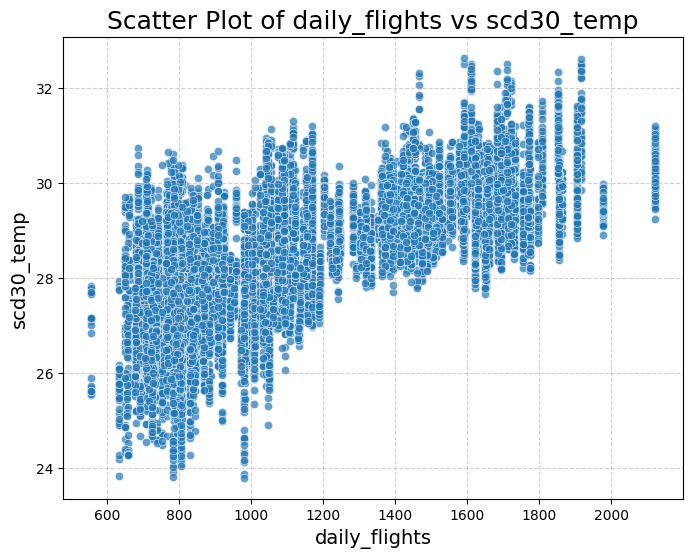

Spearman Correlation Test: daily_flights vs scd30_hum
Statistic: 0.630, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



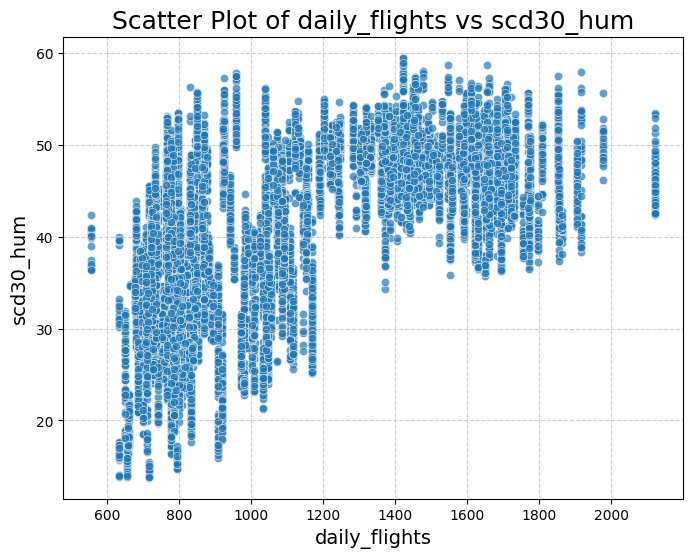

Spearman Correlation Test: sps30_pm_typ vs ads1115_value
Statistic: -0.424, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



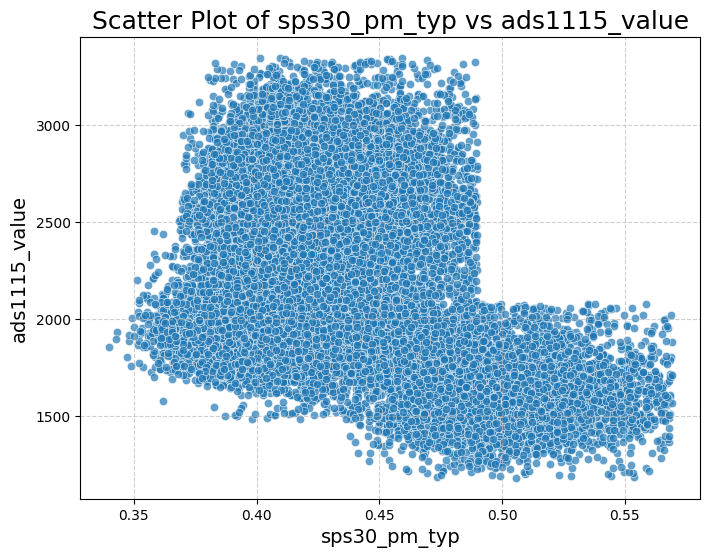

Spearman Correlation Test: sps30_pm_typ vs ads1115_voltage
Statistic: -0.424, p-value: 0.000e+00
Result: Reject H0. There is a significant monotonic relationship.



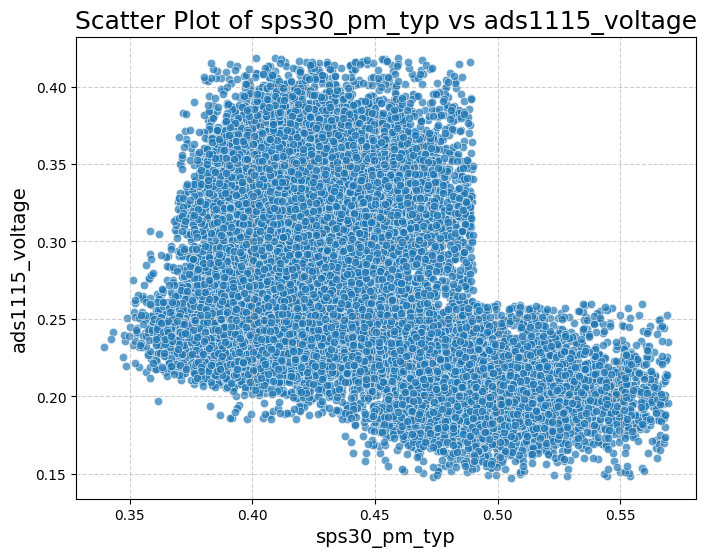

In [8]:
spearman_test_and_plot(sampled_df, correlation_pairs, "Correlation Analysis for Selected Variable Pairs")


In [1]:
import pandas as pd
df_combined_filtered = pd.read_csv("Df_final.csv", sep=';')
df_combined_filtered

,id_measure,node_id,ts_insertion,Hour,Day_of_Week,Month,Season,Holidays,ads1115_value,ads1115_voltage,...,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,AQI,daily_flights
0,1,node-air-brown,2022-10-27 10:57:14,10,3,10,3,0,2015,0.251883,...,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,244.9265,26.39463,37.0,959
1,2,node-air-brown,2022-10-27 10:57:17,10,3,10,3,0,1950,0.243757,...,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,247.5193,26.67403,38.0,959
2,3,node-air-brown,2022-10-27 10:57:19,10,3,10,3,0,1995,0.249133,...,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,251.1831,27.06886,38.0,959
3,4,node-air-brown,2022-10-27 10:57:21,10,3,10,3,0,2010,0.251258,...,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,251.6277,27.11677,38.0,959
4,5,node-air-brown,2022-10-27 10:57:23,10,3,10,3,0,1993,0.249133,...,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,252.8305,27.24640,38.0,959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19649475,11454424,node-air-silver,2023-10-13 08:04:18,8,4,10,3,0,2538,0.317635,...,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,241.1094,25.98104,37.0,1290
19649476,11454425,node-air-silver,2023-10-13 08:04:20,8,4,10,3,0,2546,0.317885,...,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,236.8026,25.51550,36.0,1290
19649477,11454426,node-air-silver,2023-10-13 08:04:22,8,4,10,3,0,2580,0.322510,...,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,235.9178,25.42320,36.0,1290
19649478,11454427,node-air-silver,2023-10-13 08:04:25,8,4,10,3,0,2592,0.324010,...,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,234.9247,25.31945,36.0,1290


In [2]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_combined_filtered['node_id'] = label_encoder.fit_transform(df_combined_filtered['node_id'])

In [3]:
df_combined_filtered

,id_measure,node_id,ts_insertion,Hour,Day_of_Week,Month,Season,Holidays,ads1115_value,ads1115_voltage,...,sps30_pm25_ug,sps30_pm4_count,sps30_pm4_ug,sps30_pm10_count,sps30_pm10_ug,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,AQI,daily_flights
0,1,0,2022-10-27 10:57:14,10,3,10,3,0,2015,0.251883,...,6.68953,50.4978,6.68954,50.5058,6.68954,0.424354,244.9265,26.39463,37.0,959
1,2,0,2022-10-27 10:57:17,10,3,10,3,0,1950,0.243757,...,6.76034,51.0324,6.76035,51.0405,6.76035,0.427185,247.5193,26.67403,38.0,959
2,3,0,2022-10-27 10:57:19,10,3,10,3,0,1995,0.249133,...,6.86041,51.7878,6.86042,51.7960,6.86041,0.428009,251.1831,27.06886,38.0,959
3,4,0,2022-10-27 10:57:21,10,3,10,3,0,2010,0.251258,...,6.87255,51.8794,6.87256,51.8877,6.87256,0.426949,251.6277,27.11677,38.0,959
4,5,0,2022-10-27 10:57:23,10,3,10,3,0,1993,0.249133,...,6.90541,52.1274,6.90541,52.1357,6.90541,0.428101,252.8305,27.24640,38.0,959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19649475,11454424,2,2023-10-13 08:04:18,8,4,10,3,0,2538,0.317635,...,6.58358,49.6660,6.58685,49.6729,6.58852,0.472971,241.1094,25.98104,37.0,1290
19649476,11454425,2,2023-10-13 08:04:20,8,4,10,3,0,2546,0.317885,...,6.46569,48.7786,6.46868,48.7854,6.47021,0.475865,236.8026,25.51550,36.0,1290
19649477,11454426,2,2023-10-13 08:04:22,8,4,10,3,0,2580,0.322510,...,6.44214,48.5968,6.44558,48.6036,6.44734,0.478201,235.9178,25.42320,36.0,1290
19649478,11454427,2,2023-10-13 08:04:25,8,4,10,3,0,2592,0.324010,...,6.41568,48.3927,6.41960,48.3995,6.42159,0.477551,234.9247,25.31945,36.0,1290


In [4]:
from sklearn.model_selection import train_test_split

# Stratified Sampling by 'node_id'
sampled_mini_df, _ = train_test_split(
    df_combined_filtered,
    test_size=0.95,
    stratify=df_combined_filtered['node_id'],
    random_state=42
)

print("Original Dataset Size:", df_combined_filtered.shape)
print("Sampled Dataset Size:", sampled_mini_df.shape)

Original Dataset Size: (19649480, 27)
Sampled Dataset Size: (982474, 27)


In [5]:
# Example columns for comparison (e.g., AQI and CO2)
columns_to_compare = [
    'Month', 'Season', 'AQI', 'scd30_co2', 'ads1115_value', 
    'ads1115_voltage', 'scd30_temp', 'scd30_hum', 
    'sps30_pm_typ', 'PM_Total_Count', 'PM_Total_Mass', 'daily_flights'
]

pd.set_option('display.float_format', '{:.3f}'.format)

# Original dataset statistics
original_stats = df_combined_filtered[columns_to_compare].describe()

# Sampled mini dataset statistics
sampled_stats = sampled_mini_df[columns_to_compare].describe()

# Print the comparison
print("Original Dataset Statistics:")
original_stats

Original Dataset Statistics:


,Month,Season,AQI,scd30_co2,ads1115_value,ads1115_voltage,scd30_temp,scd30_hum,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,daily_flights
count,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000,19649480.000
mean,6.627,1.620,17.990,629.458,2195.730,0.274,28.404,40.012,0.439,118.423,12.779,1127.668
std,3.414,1.110,9.603,108.964,487.879,0.061,1.372,8.855,0.045,63.235,6.818,369.336
min,1.000,0.000,0.000,397.930,1180.000,0.147,23.796,13.042,0.336,0.820,0.089,556.000
25%,4.000,1.000,11.000,545.445,1791.000,0.224,27.387,33.285,0.405,69.958,7.553,787.000
50%,7.000,2.000,16.000,603.397,2113.000,0.264,28.549,41.415,0.429,108.436,11.704,1040.000
75%,9.000,3.000,24.000,696.272,2620.000,0.328,29.401,47.376,0.471,158.974,17.155,1451.000
max,12.000,3.000,46.000,963.807,3350.000,0.419,32.653,62.913,0.569,301.364,33.005,2120.000


In [6]:
print("\nSampled Dataset Statistics:")
sampled_stats


Sampled Dataset Statistics:


,Month,Season,AQI,scd30_co2,ads1115_value,ads1115_voltage,scd30_temp,scd30_hum,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,daily_flights
count,982474.000,982474.000,982474.000,982474.000,982474.000,982474.000,982474.000,982474.000,982474.000,982474.000,982474.000,982474.000
mean,6.627,1.620,17.988,629.444,2195.661,0.274,28.405,40.010,0.439,118.411,12.778,1127.920
std,3.413,1.110,9.605,108.935,487.674,0.061,1.372,8.859,0.045,63.249,6.819,369.369
min,1.000,0.000,0.000,415.600,1180.000,0.147,23.796,13.115,0.336,1.296,0.139,556.000
25%,4.000,1.000,11.000,545.558,1791.000,0.224,27.387,33.270,0.405,69.913,7.547,787.000
50%,7.000,2.000,16.000,603.258,2112.000,0.264,28.549,41.415,0.429,108.362,11.696,1040.000
75%,9.000,3.000,24.000,696.384,2619.000,0.328,29.401,47.382,0.471,158.898,17.146,1453.000
max,12.000,3.000,46.000,963.807,3350.000,0.419,32.653,62.230,0.569,301.361,32.866,2120.000


In [7]:
# Function to calculate percentage difference
def calculate_percentage_difference(original_value, sampled_value):
    return ((sampled_value - original_value) / original_value) * 100

# Calculate percentage differences and create a new DataFrame
percentage_diff = pd.DataFrame(index=['mean', 'std'], columns=columns_to_compare)

# Calculate percentage differences for mean and std for each column
for column in columns_to_compare:
    for stat in ['mean', 'std']:  # Considering only 'mean' and 'std' values
        original_value = original_stats.loc[stat, column]
        sampled_value = sampled_stats.loc[stat, column]
        percentage_diff.loc[stat, column] = calculate_percentage_difference(original_value, sampled_value)

# Print the percentage differences
print("\nPercentage Differences Between Variables (Mean and Std):")
percentage_diff


Percentage Differences Between Variables (Mean and Std):


,Month,Season,AQI,scd30_co2,ads1115_value,ads1115_voltage,scd30_temp,scd30_hum,sps30_pm_typ,PM_Total_Count,PM_Total_Mass,daily_flights
mean,0.000,-0.004,-0.011,-0.002,-0.003,-0.003,0.004,-0.007,0.009,-0.010,-0.009,0.022
std,-0.023,-0.033,0.021,-0.027,-0.042,-0.042,-0.013,0.049,0.075,0.021,0.022,0.009


In [8]:
import pandas as pd
from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, PolynomialFeatures
)
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns


x = sampled_mini_df[['node_id','Hour', 'Day_of_Week', 'Month',
       'Season', 'Holidays', 'ads1115_value', 'ads1115_voltage','daily_flights',
       'scd30_temp', 'scd30_hum','sps30_pm_typ',
       'PM_Total_Count', 'PM_Total_Mass', 'AQI']]
y = sampled_mini_df['scd30_co2']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

scalers = {
    'MinMaxScaler': MinMaxScaler(),
}

algorithms = {
    'DecisionTree': DecisionTreeRegressor(),
    'RandomForest': RandomForestRegressor(),
    'xGBoost': XGBRegressor()
}

detailed_results = []

for scaler_name, scaler in scalers.items():
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(x_test)
  
    for algo_name, model in algorithms.items():
        model.fit(x_train_scaled, y_train)

        y_test_pred = model.predict(x_test_scaled)

        test_r2 = r2_score(y_test, y_test_pred)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)

        detailed_results.append({
            'Scaler': scaler_name,
            'Algorithm': algo_name,
            'Test_R2_Score': test_r2,
            'Test_MSE': test_mse,
            'Test_MAE': test_mae,
        })

detailed_results_df = pd.DataFrame(detailed_results)

detailed_results_df

,Scaler,Algorithm,Test_R2_Score,Test_MSE,Test_MAE
0,MinMaxScaler,DecisionTree,0.942,685.805,12.596
1,MinMaxScaler,RandomForest,0.975,297.756,10.136
2,MinMaxScaler,xGBoost,0.863,1631.493,28.893


In [9]:
import pandas as pd
from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, PolynomialFeatures
)
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns


x = sampled_mini_df[['node_id','Hour', 'Day_of_Week', 'Month',
       'Season', 'Holidays', 'ads1115_value', 'ads1115_voltage','daily_flights',
       'scd30_temp', 'scd30_hum','sps30_pm_typ', 'scd30_co2']]
y = sampled_mini_df['AQI']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

scalers = {
    'MinMaxScaler': MinMaxScaler(),
}

algorithms = {
    'DecisionTree': DecisionTreeRegressor(),
    'RandomForest': RandomForestRegressor(),
    'xGBoost': XGBRegressor()
}

detailed_results = []

for scaler_name, scaler in scalers.items():
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(x_test)
  
    for algo_name, model in algorithms.items():
        model.fit(x_train_scaled, y_train)

        y_test_pred = model.predict(x_test_scaled)

        test_r2 = r2_score(y_test, y_test_pred)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)

        detailed_results.append({
            'Scaler': scaler_name,
            'Algorithm': algo_name,
            'Test_R2_Score': test_r2,
            'Test_MSE': test_mse,
            'Test_MAE': test_mae,
        })

detailed_results_df = pd.DataFrame(detailed_results)

detailed_results_df

,Scaler,Algorithm,Test_R2_Score,Test_MSE,Test_MAE
0,MinMaxScaler,DecisionTree,0.895,9.633,1.976
1,MinMaxScaler,RandomForest,0.949,4.687,1.517
2,MinMaxScaler,xGBoost,0.786,19.708,3.307


In [14]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import KFold
import numpy as np

x = sampled_mini_df[['node_id', 'Hour', 'Day_of_Week', 'Month',
                     'Season', 'Holidays', 'ads1115_value', 'ads1115_voltage',
                     'daily_flights', 'scd30_temp', 'scd30_hum',
                     'sps30_pm_typ', 'scd30_co2']]
y = sampled_mini_df['AQI']

scalers = {'MinMaxScaler': MinMaxScaler()}
algorithms = {
    'DecisionTree': DecisionTreeRegressor(),
    'RandomForest': RandomForestRegressor(),
    'xGBoost': XGBRegressor()
}

kf = KFold(n_splits=10, shuffle=True, random_state=42)
detailed_results = []

for scaler_name, scaler in scalers.items():
    for algo_name, model in algorithms.items():
        fold_r2, fold_mse, fold_mae = [], [], []
        
        for train_idx, test_idx in kf.split(x):
            x_train, x_test = x.iloc[train_idx], x.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            x_train_scaled = scaler.fit_transform(x_train)
            x_test_scaled = scaler.transform(x_test)
            
            model.fit(x_train_scaled, y_train)
            y_pred = model.predict(x_test_scaled)
            
            fold_r2.append(r2_score(y_test, y_pred))
            fold_mse.append(mean_squared_error(y_test, y_pred))
            fold_mae.append(mean_absolute_error(y_test, y_pred))
            

        detailed_results.append({
            'Scaler': scaler_name,
            'Algorithm': algo_name,
            'Mean_R2_Score': np.mean(fold_r2),
            'Mean_MSE': np.mean(fold_mse),
            'Mean_MAE': np.mean(fold_mae)
        })

detailed_results_df = pd.DataFrame(detailed_results)
detailed_results_df

,Scaler,Algorithm,Mean_R2_Score,Mean_MSE,Mean_MAE
0,MinMaxScaler,DecisionTree,0.907,8.587,1.876
1,MinMaxScaler,RandomForest,0.954,4.248,1.451
2,MinMaxScaler,xGBoost,0.784,19.903,3.328


In [11]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import KFold
import numpy as np

x = sampled_mini_df[['node_id','Hour', 'Day_of_Week', 'Month',
       'Season', 'Holidays', 'ads1115_value', 'ads1115_voltage','daily_flights',
       'scd30_temp', 'scd30_hum','sps30_pm_typ',
       'PM_Total_Count', 'PM_Total_Mass', 'AQI']]
y = sampled_mini_df['scd30_co2']

scalers = {'MinMaxScaler': MinMaxScaler()}
algorithms = {
    'DecisionTree': DecisionTreeRegressor(),
    'RandomForest': RandomForestRegressor(),
    'xGBoost': XGBRegressor()
}

kf = KFold(n_splits=10, shuffle=True, random_state=42)
detailed_results = []

for scaler_name, scaler in scalers.items():
    for algo_name, model in algorithms.items():
        fold_r2, fold_mse, fold_mae = [], [], []
        
        for train_idx, test_idx in kf.split(x):
            x_train, x_test = x.iloc[train_idx], x.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            x_train_scaled = scaler.fit_transform(x_train)
            x_test_scaled = scaler.transform(x_test)
            
            model.fit(x_train_scaled, y_train)
            y_pred = model.predict(x_test_scaled)
            
            fold_r2.append(r2_score(y_test, y_pred))
            fold_mse.append(mean_squared_error(y_test, y_pred))
            fold_mae.append(mean_absolute_error(y_test, y_pred))
            

        detailed_results.append({
            'Scaler': scaler_name,
            'Algorithm': algo_name,
            'Mean_R2_Score': np.mean(fold_r2),
            'Mean_MSE': np.mean(fold_mse),
            'Mean_MAE': np.mean(fold_mae)
        })

detailed_results_df = pd.DataFrame(detailed_results)
detailed_results_df

,Scaler,Algorithm,Mean_R2_Score,Mean_MSE,Mean_MAE
0,MinMaxScaler,DecisionTree,0.947,628.059,11.738
1,MinMaxScaler,RandomForest,0.978,257.675,9.309
2,MinMaxScaler,xGBoost,0.860,1658.694,29.145
